# Introduction

- **session_id** - the ID of the session the event took place in
- **index** - the index of the event for the session
- **elapsed_time** - how much time has passed (in milliseconds) between the start of the session and when the event was recorded
- **event_name** - the name of the event type
- **name** - the event name (e.g. identifies whether a notebook_click is opening or closing the notebook)
- **level** - what level of the game the event occurred in (0 to 22)
- **page** - the page number of the event (only for notebook-related events)
- **room_coor_x** - the coordinates of the click in reference to the in-game room (only for click events)
- **room_coor_y** - the coordinates of the click in reference to the in-game room (only for click events)
- **screen_coor_x** - the coordinates of the click in reference to the player’s screen (only for click events)
- **screen_coor_y** - the coordinates of the click in reference to the player’s screen (only for click events)
- **hover_duration** - how long (in milliseconds) the hover happened for (only for hover events)
- **text** - the text the player sees during this event
- **fqid** - the fully qualified ID of the event
- **room_fqid** - the fully qualified ID of the room the event took place in
- **text_fqid** - the fully qualified ID of the
- **fullscreen** - whether the player is in fullscreen mode
- **hq** - whether the game is in high-quality
- **music** - whether the game music is on or off
- **level_group** - which group of levels - and group of questions - this row belongs to (0-4, 5-12, 13-22)

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Train

## Data

In [3]:
# Reference: https://www.kaggle.com/competitions/predict-student-performance-from-game-play/discussion/384359
dtypes={
    'elapsed_time': np.int32,
    'event_name': 'category',
    'name': 'category',
    'level': np.uint8,
    'room_coor_x': np.float32,
    'room_coor_y': np.float32,
    'screen_coor_x': np.float32,
    'screen_coor_y': np.float32,
    'hover_duration': np.float32,
    'text': 'category',
    'fqid': 'category',
    'room_fqid': 'category',
    'text_fqid': 'category',
    'fullscreen': 'category',
    'hq': 'category',
    'music': 'category',
    'level_group': 'category'
}

train_data = pd.read_csv('../data/train.csv', dtype=dtypes)

In [4]:
## Reference: https://www.kaggle.com/code/kimtaehun/lightgbm-baseline-with-aggregated-log-data?scriptVersionId=118573291&cellId=15
def summarize_data_info(df: pd.DataFrame) -> pd.DataFrame:
    summary = pd.DataFrame(df.dtypes, columns=['data_type'])
    
    summary['perc_missing'] = df.isnull().sum().values * 100
    summary['perc_missing'] = df.isnull().sum().values / len(df)
    summary['n_unique'] = df.nunique().values
    
    summary['first_value'] = df.loc[0].values
    summary['second_value'] = df.loc[1].values
    summary['third_value'] = df.loc[2].values
    
    df_describe = pd.DataFrame(df.describe(include='all').transpose())
    summary['min'] = df_describe['min'].values
    summary['max'] = df_describe['max'].values
    
    print(f'Data Shape: {df.shape}')
    
    return summary

In [5]:
summary = summarize_data_info(train_data)
summary

Data Shape: (26296946, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.000000,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int64,0.000000,20348,0,1,2,0.0,20473.0
elapsed_time,int32,0.000000,5042639,0,1323,831,0.0,1988606704.0
event_name,category,0.000000,11,cutscene_click,person_click,person_click,NaN,NaN
name,category,0.000000,6,basic,basic,basic,NaN,NaN
level,uint8,0.000000,23,0,0,0,0.0,22.0
page,float64,0.978532,7,NaN,NaN,NaN,0.0,6.0
room_coor_x,float32,0.078841,12538215,-413.991394,-413.991394,-413.991394,-1992.354614,1261.773804
room_coor_y,float32,0.078841,9551136,-159.314682,-159.314682,-159.314682,-918.162354,543.616394
screen_coor_x,float32,0.078841,57477,380.0,380.0,380.0,0.0,1919.0


In [6]:
# Reduce Memory Usage
# reference : https://www.kaggle.com/code/arjanso/reducing-dataframe-memory-size-by-65 @ARJANGROEN

def reduce_memory_usage(df):
    
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype.name
        if ((col_type != 'datetime64[ns]') & (col_type != 'category')):
            if (col_type != 'object'):
                c_min = df[col].min()
                c_max = df[col].max()

                if str(col_type)[:3] == 'int':
                    if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                        df[col] = df[col].astype(np.int8)
                    elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                        df[col] = df[col].astype(np.int16)
                    elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                        df[col] = df[col].astype(np.int32)
                    elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                        df[col] = df[col].astype(np.int64)

                else:
                    if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                        df[col] = df[col].astype(np.float16)
                    elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                        df[col] = df[col].astype(np.float32)
                    else:
                        pass
            else:
                df[col] = df[col].astype('category')
    mem_usg = df.memory_usage().sum() / 1024**2 
    print("Memory usage became: ",mem_usg," MB")
    
    return df

In [7]:
train_data = reduce_memory_usage(train_data)

Memory usage of dataframe is 1529.83 MB
Memory usage became:  1053.3384094238281  MB


In [8]:
summary = summarize_data_info(train_data)
summary

Data Shape: (26296946, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.000000,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.000000,20348,0,1,2,0.0,20473.0
elapsed_time,int32,0.000000,5042639,0,1323,831,0.0,1988606704.0
event_name,category,0.000000,11,cutscene_click,person_click,person_click,NaN,NaN
name,category,0.000000,6,basic,basic,basic,NaN,NaN
level,float16,0.000000,23,0.0,0.0,0.0,0.0,22.0
page,float16,0.978532,7,NaN,NaN,NaN,0.0,6.0
room_coor_x,float16,0.078841,29854,-414.0,-414.0,-414.0,-1992.0,1262.0
room_coor_y,float16,0.078841,27847,-159.375,-159.375,-159.375,-918.0,543.5
screen_coor_x,float16,0.078841,6866,380.0,380.0,380.0,0.0,1919.0


### `Text` Field Preprocessing

In [9]:
from typing import Dict

def preprocess_text_str(text_str: str) -> str:
    s = str(text_str).replace("\\", "")
    text_str_ = "undefined" if s.startswith("u0") or (s in ["undefined", "nan"]) else s
    
    text_str__clean = text_str_.split("u0")[0] if "u0" in text_str_ else text_str_ 
    
    return text_str__clean

def create_text_field__clean_dict(data: pd.DataFrame(), text_field: str) -> Dict:
    text_values = list(data[text_field].unique())
    text_values_ = [preprocess_text_str(s) for s in text_values]
    
    text_field__clean_dict = dict(zip(text_values, text_values_))
    
    return text_field__clean_dict

def map_text_field(data: pd.DataFrame, text_field: str, text_field__clean_dict: Dict) -> pd.DataFrame:
    data[text_field] = data[text_field].map(text_values__clean_dict).fillna("undefined")
    
    return data

def recategorize_category_typed_fields(data: pd.DataFrame) -> pd.DataFrame:
    for field_name, dtype in data.dtypes.items():
        if dtype == "category":
            data[field_name] = data[field_name].astype(str).astype("category")
            
    return data

In [10]:
text_values = list(train_data["text"].unique())
text_values[:20]

['undefined',
 'Whatcha doing over there, Jo?',
 'Just talking to Teddy.',
 'I gotta run to my meeting!',
 'Can I come, Gramps?',
 'Sure thing, Jo. Grab your notebook and come upstairs!',
 'See you later, Teddy.',
 "I get to go to Gramps's meeting!",
 'Now where did I put my notebook?',
 '\\u00f0\\u0178\\u02dc\\u00b4',
 nan,
 'I love these photos of me and Teddy!',
 'Found it!',
 'Gramps is in trouble for losing papers?',
 "This can't be right!",
 'Gramps is a great historian!',
 "Hmm. Button's still not working.",
 "Let's get started. The Wisconsin Wonders exhibit opens tomorrow!",
 'Who wants to investigate the shirt artifact?',
 "Not Leopold here. He's been losing papers lately."]

In [11]:
text_values_ = [preprocess_text_str(s) for s in text_values]
text_values_[:20]

['undefined',
 'Whatcha doing over there, Jo?',
 'Just talking to Teddy.',
 'I gotta run to my meeting!',
 'Can I come, Gramps?',
 'Sure thing, Jo. Grab your notebook and come upstairs!',
 'See you later, Teddy.',
 "I get to go to Gramps's meeting!",
 'Now where did I put my notebook?',
 'undefined',
 'undefined',
 'I love these photos of me and Teddy!',
 'Found it!',
 'Gramps is in trouble for losing papers?',
 "This can't be right!",
 'Gramps is a great historian!',
 "Hmm. Button's still not working.",
 "Let's get started. The Wisconsin Wonders exhibit opens tomorrow!",
 'Who wants to investigate the shirt artifact?',
 "Not Leopold here. He's been losing papers lately."]

In [12]:
text_field__clean_dict = dict(zip(text_values, text_values_))
train_data["text"] = train_data["text"].map(text_field__clean_dict).fillna("undefined").astype('category')

In [13]:
summary = summarize_data_info(train_data)
summary

Data Shape: (26296946, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.000000,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.000000,20348,0,1,2,0.0,20473.0
elapsed_time,int32,0.000000,5042639,0,1323,831,0.0,1988606704.0
event_name,category,0.000000,11,cutscene_click,person_click,person_click,NaN,NaN
name,category,0.000000,6,basic,basic,basic,NaN,NaN
level,float16,0.000000,23,0.0,0.0,0.0,0.0,22.0
page,float16,0.978532,7,NaN,NaN,NaN,0.0,6.0
room_coor_x,float16,0.078841,29854,-414.0,-414.0,-414.0,-1992.0,1262.0
room_coor_y,float16,0.078841,27847,-159.375,-159.375,-159.375,-918.0,543.5
screen_coor_x,float16,0.078841,6866,380.0,380.0,380.0,0.0,1919.0


### Train Labels

In [14]:
train_labels = pd.read_csv("../data/train_labels.csv")

In [15]:
summary = summarize_data_info(train_labels)
summary

Data Shape: (424116, 2)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,object,0.0,424116,20090312431273200_q1,20090312433251036_q1,20090312455206810_q1,NaN,NaN
correct,int64,0.0,2,1,0,1,0.0,1.0


In [16]:
train_labels['question_no'] = train_labels['session_id'].apply(lambda x: int(x.split('_')[-1][1:]))
train_labels['session_id'] = train_labels['session_id'].apply(lambda x: int(x.split('_')[0]) )

train_labels["session_id"].nunique()

23562

In [17]:
summary = summarize_data_info(train_labels)
summary

Data Shape: (424116, 3)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312433251036,20090312455206810,2.009031e+16,2.210022e+16
correct,int64,0.0,2,1,0,1,0.000000e+00,1.000000e+00
question_no,int64,0.0,18,1,1,1,1.000000e+00,1.800000e+01


#### Validity check >>> Train Labels

In [18]:
train_labels.groupby("session_id")["question_no"].nunique().value_counts()

18    23562
Name: question_no, dtype: int64

In [19]:
question_no__list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
len(train_labels[~train_labels["question_no"].isin(question_no__list)])

0

In [20]:
len(train_labels) == (23562 * 18)

True

#### Validity check >>> Session ids in datasets

In [21]:
train_data__session_id_unique_vals = train_data["session_id"].drop_duplicates().sort_values().reset_index(drop=True)
train_labels__session_id_unique_vals = train_labels["session_id"].drop_duplicates().sort_values().reset_index(drop=True)

pd.testing.assert_series_equal(train_data__session_id_unique_vals, train_labels__session_id_unique_vals)

### Downsampling

In [22]:
session_ids = sorted(train_labels["session_id"].unique())

np.random.seed(42)
np.random.shuffle(session_ids)

session_ids[:5]

[22010107585684490,
 20100413373831344,
 21000409261644490,
 20110314164224844,
 21080621495509370]

In [23]:
N_CHUNKS = 10

np.random.seed(42)
chunk_ids = np.random.randint(N_CHUNKS, size=len(session_ids))

session_chunk_df = pd.DataFrame({"session_id": session_ids, "chunk_id": chunk_ids})
session_chunk_df["chunk_id"].value_counts()

0    2418
9    2407
5    2395
6    2360
1    2358
2    2350
3    2347
7    2320
8    2311
4    2296
Name: chunk_id, dtype: int64

In [24]:
session_chunk_df["chunk_id"].nunique()

10

# EDA per Event

In [25]:
from typing import List, Tuple, Dict

def get_heatmap_values(df: pd.DataFrame, col_pair: List[str], count_thres: int=0) -> pd.DataFrame:
    df__col_pair = df[[*col_pair, "correct"]]

    subcount_df = df__col_pair.groupby([*col_pair, "correct"]).size().rename("subcount").reset_index()
    count_df = df__col_pair.groupby(col_pair).size().loc[lambda x: x > count_thres].rename("count").reset_index()

    df__all_counts = subcount_df.merge(count_df, on=col_pair, how="left")
    df__all_counts["perc"] = df__all_counts["subcount"] / df__all_counts["count"]

    df__heatmap = df__all_counts[df__all_counts["correct"] == 1].pivot_table(index=col_pair[0], columns=col_pair[1], values="perc")
    df__heatmap = df__heatmap[sorted(df__heatmap.columns.to_list())].sort_index()

    return df__heatmap

def plot_heatmap(df__heatmap: pd.DataFrame, figsize: Tuple[int] = (12, 12)):
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(df__heatmap, annot=True, cbar=False, cmap="coolwarm", ax=ax)
    
    plt.show()
    
def plot_heatmap__count(df: pd.DataFrame, col_pair: List[str], count_thres: int = 0, figsize: Tuple[int] = (12, 12)):
    df__count = df__cutscene_click.groupby(col_pair).size().rename("count").loc[lambda x: x > count_thres].reset_index()
    df__heatmap = df__count.pivot_table(index=col_pair[0], columns=col_pair[1], values="count")
    
    df__heatmap = df__heatmap[sorted(df__heatmap.columns.to_list())].sort_index()
    
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(df__heatmap, annot=True, cbar=False, fmt="g", cmap="coolwarm", ax=ax)
    
    plt.show()

## Event Categories

In [26]:
for i in train_data["event_name"].unique().categories:
    print(i)

checkpoint
cutscene_click
map_click
map_hover
navigate_click
notebook_click
notification_click
object_click
object_hover
observation_click
person_click


In [86]:
def add_question_labels(event_data: pd.DataFrame, labels_data: pd.DataFrame, question_no: int) -> pd.DataFrame:
    df__labels = labels_data[labels_data["question_no"] == question_no].drop(labels=["question_no"], axis=1).reset_index(drop=True)
    event_data = event_data.merge(df__labels, on="session_id", how="left")
    
    return event_data

def add_question_labels__event_data(event_data: pd.DataFrame, labels_data: pd.DataFrame, cat_fields: List[str]) -> pd.DataFrame:
    df = event_data[["session_id", "level_group", *cat_fields]]
    
    N_CHUNKS = 50
    session_ids = sorted(df["session_id"].unique())

    np.random.seed(42)
    np.random.shuffle(session_ids)

    np.random.seed(42)
    chunk_ids = np.random.randint(N_CHUNKS, size=len(session_ids))

    session_chunk_df = pd.DataFrame({"session_id": session_ids, "chunk_id": chunk_ids})

    for chunk_id in set(chunk_ids):
        session_ids_list = session_chunk_df[session_chunk_df["chunk_id"] == chunk_id]["session_id"].to_list()
        df__chunk = df[df["session_id"].isin(session_ids_list)].reset_index(drop=True)
    
        dfs = list()
        for question_no in range(1, 19):
            df__chunk__labelled = add_question_labels(df__chunk, labels_data, question_no)
            df__chunk__labelled["question_no"] = question_no
        
            dfs.append(df__chunk__labelled)
        
        df__chunk = pd.concat(dfs)
        dfs_chunk.append(df__chunk)
    
    return pd.concat(dfs_chunk)

### Category Fields

In [87]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26296946 entries, 0 to 26296945
Data columns (total 8 columns):
 #   Column       Dtype   
---  ------       -----   
 0   session_id   int64   
 1   level_group  category
 2   event_name   category
 3   name         category
 4   text         category
 5   fqid         category
 6   room_fqid    category
 7   text_fqid    category
dtypes: category(7), int64(1)
memory usage: 426.4 MB


In [88]:
index_fields = ["session_id", "level_group"]
category_fields = ["event_name", "name", "text", "fqid", "room_fqid", "text_fqid"]

train_data = train_data[[*index_fields, *category_fields]]

## `event_name` == `"checkpoint"`

In [89]:
event_data = train_data[train_data["event_name"] == "checkpoint"].reset_index(drop=True)
event_data.head()

,session_id,level_group,event_name,name,text,fqid,room_fqid,text_fqid
0,20090312431273200,0-4,checkpoint,basic,undefined,chap1_finale_c,tunic.capitol_0.hall,NaN
1,20090312431273200,5-12,checkpoint,basic,undefined,chap2_finale_c,tunic.capitol_1.hall,NaN
2,20090312431273200,13-22,checkpoint,basic,undefined,chap4_finale_c,tunic.capitol_2.hall,NaN
3,20090312433251036,0-4,checkpoint,basic,undefined,chap1_finale_c,tunic.capitol_0.hall,NaN
4,20090312433251036,5-12,checkpoint,basic,undefined,chap2_finale_c,tunic.capitol_1.hall,NaN


## `event_name` == `"cutscene_click"`

In [82]:
event_data = train_data[train_data["event_name"] == "cutscene_click"].reset_index(drop=True)
event_data.head()

,session_id,level_group,event_name,name,text,fqid,room_fqid,text_fqid
0,20090312431273200,0-4,cutscene_click,basic,undefined,intro,tunic.historicalsociety.closet,tunic.historicalsociety.closet.intro
1,20090312431273200,0-4,cutscene_click,basic,Let's get started. The Wisconsin Wonders exhib...,groupconvo,tunic.historicalsociety.entry,tunic.historicalsociety.entry.groupconvo
2,20090312431273200,0-4,cutscene_click,basic,Who wants to investigate the shirt artifact?,groupconvo,tunic.historicalsociety.entry,tunic.historicalsociety.entry.groupconvo
3,20090312431273200,0-4,cutscene_click,basic,Not Leopold here. He's been losing papers lately.,groupconvo,tunic.historicalsociety.entry,tunic.historicalsociety.entry.groupconvo
4,20090312431273200,0-4,cutscene_click,basic,Hey!,groupconvo,tunic.historicalsociety.entry,tunic.historicalsociety.entry.groupconvo


#### `text`

In [83]:
df = add_question_labels__event_data(event_data, train_labels, ["text"])
df = recategorize_category_typed_fields(df)

df.head()

,level_group,text,fqid,session_id,correct,question_no
0,0-4,undefined,NaN,20090314363702160,1,1
1,5-12,undefined,NaN,20090314363702160,1,1
2,13-22,undefined,NaN,20090314363702160,1,1
3,0-4,undefined,NaN,20100010554738616,0,1
4,5-12,undefined,NaN,20100010554738616,0,1


In [85]:
df.groupby(["level_group", "text", "question_no", "correct"]).size()

level_group  text                        question_no  correct
0-4          AND I know who took Teddy!  1            0               0
                                                      1               0
                                         2            0               0
                                                      1               0
                                         3            0               0
                                                                  ...  
5-12         undefined                   16           1          699768
                                         17           0          298023
                                                      1          655333
                                         18           0           47709
                                                      1          905647
Length: 19008, dtype: int64

In [ ]:
summary = summarize_data_info(df__cutscene_click)
summary

#### Insights

- `name` field is constant (basic).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

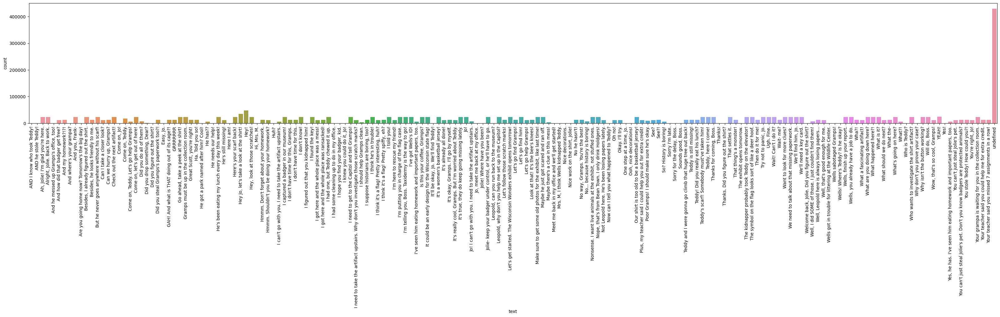

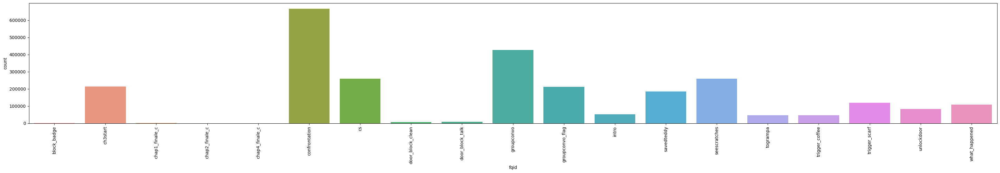

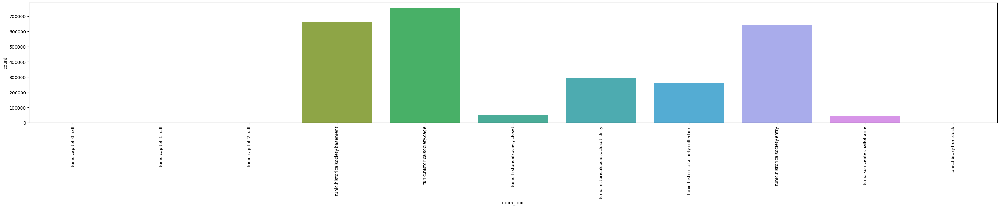

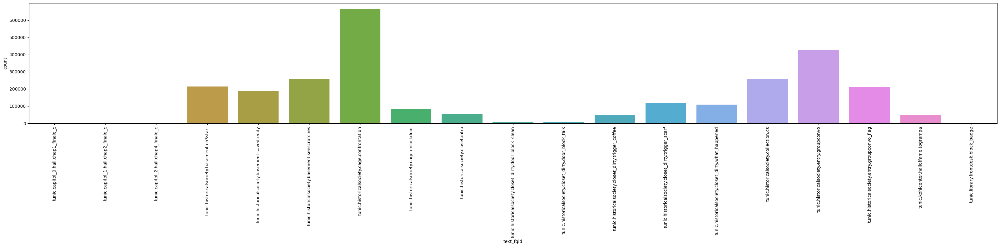

In [306]:
cat_fields_list = ["text", "fqid", "room_fqid", "text_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(40, 5))
    sns.countplot(data=df__cutscene_click, x=col_name, ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

In [312]:
COUNT_THRES = 100

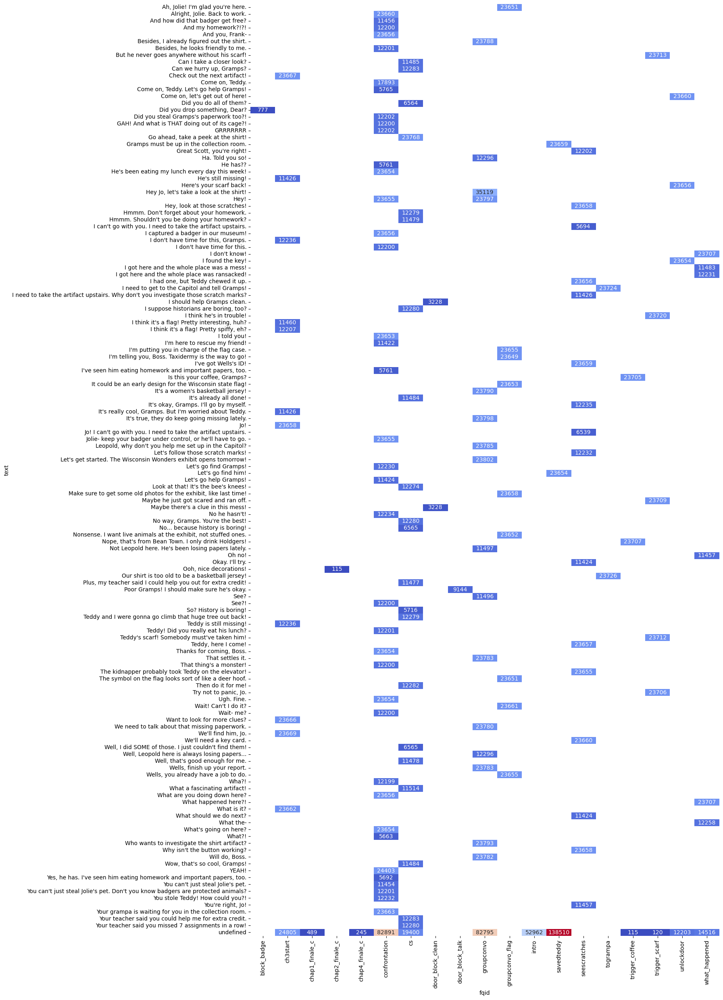

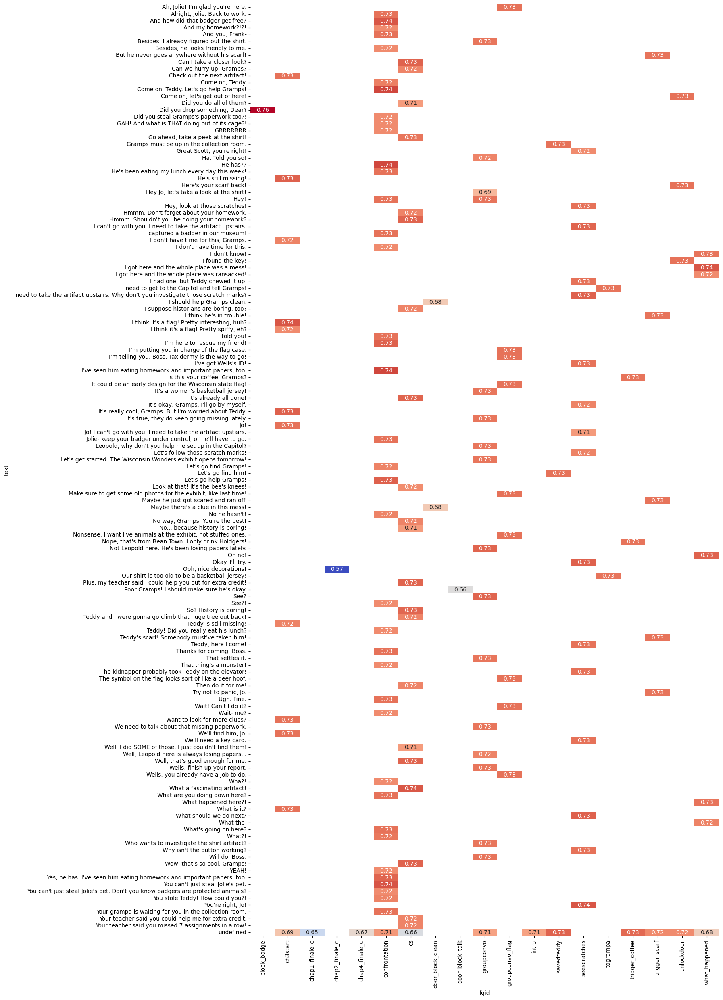

In [315]:
col_pair = ["text", "fqid"]
plot_heatmap__count(df__cutscene_click, col_pair, COUNT_THRES, figsize=(15, 30))
plot_heatmap(get_heatmap_values(df__cutscene_click, col_pair, COUNT_THRES), figsize=(15, 30))

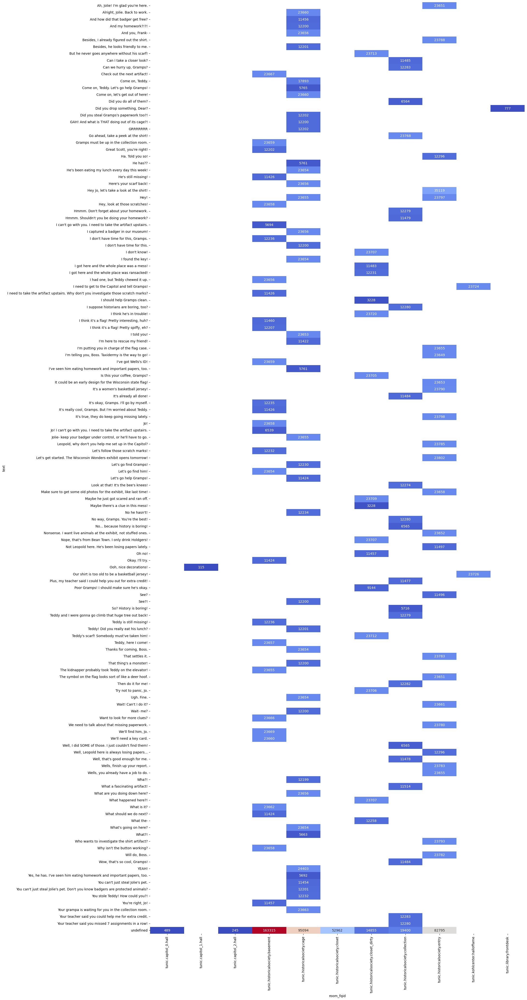

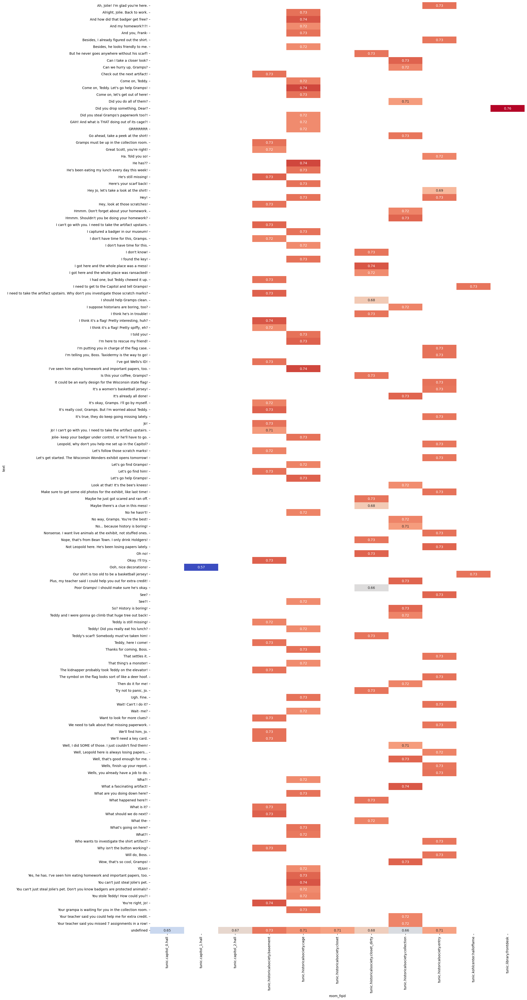

In [316]:
col_pair = ["text", "room_fqid"]
plot_heatmap__count(df__cutscene_click, col_pair, COUNT_THRES, figsize=(20, 50))
plot_heatmap(get_heatmap_values(df__cutscene_click, col_pair, COUNT_THRES), figsize=(20, 50))

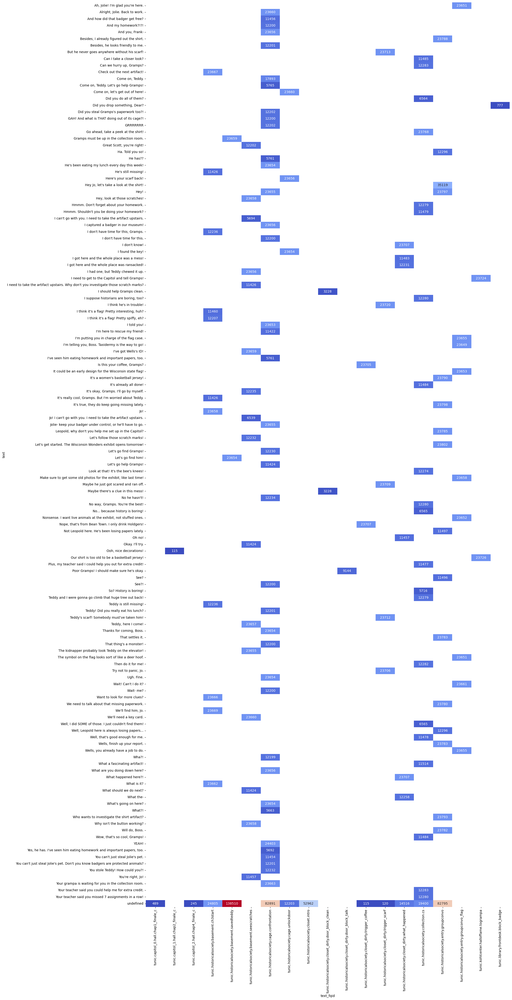

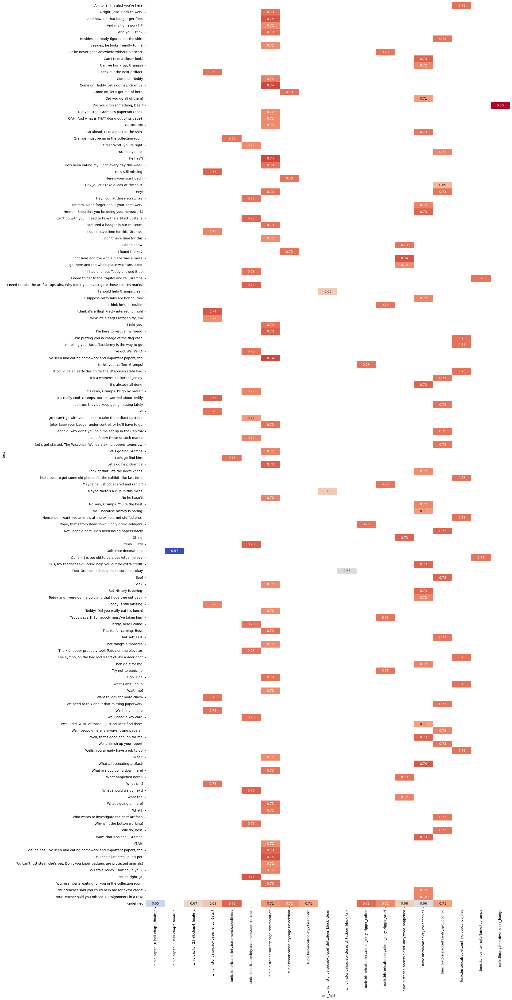

In [317]:
col_pair = ["text", "text_fqid"]
plot_heatmap__count(df__cutscene_click, col_pair, COUNT_THRES, figsize=(20, 50))
plot_heatmap(get_heatmap_values(df__cutscene_click, col_pair, COUNT_THRES), figsize=(20, 50))

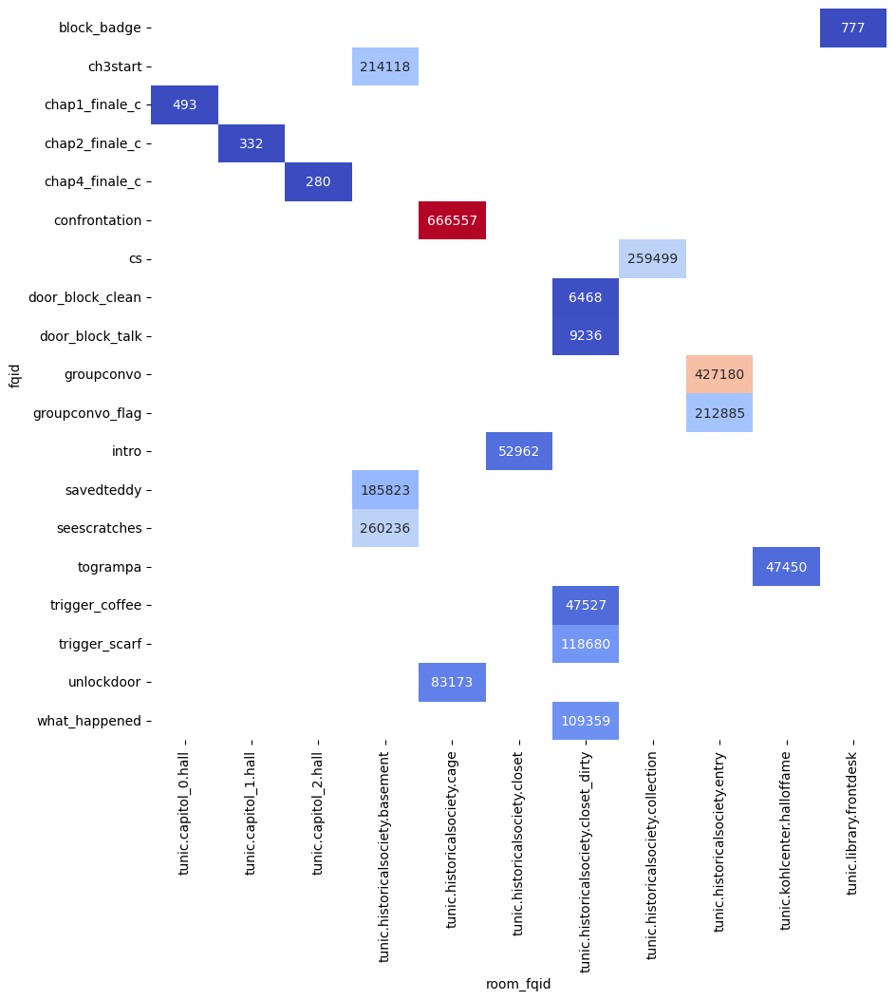

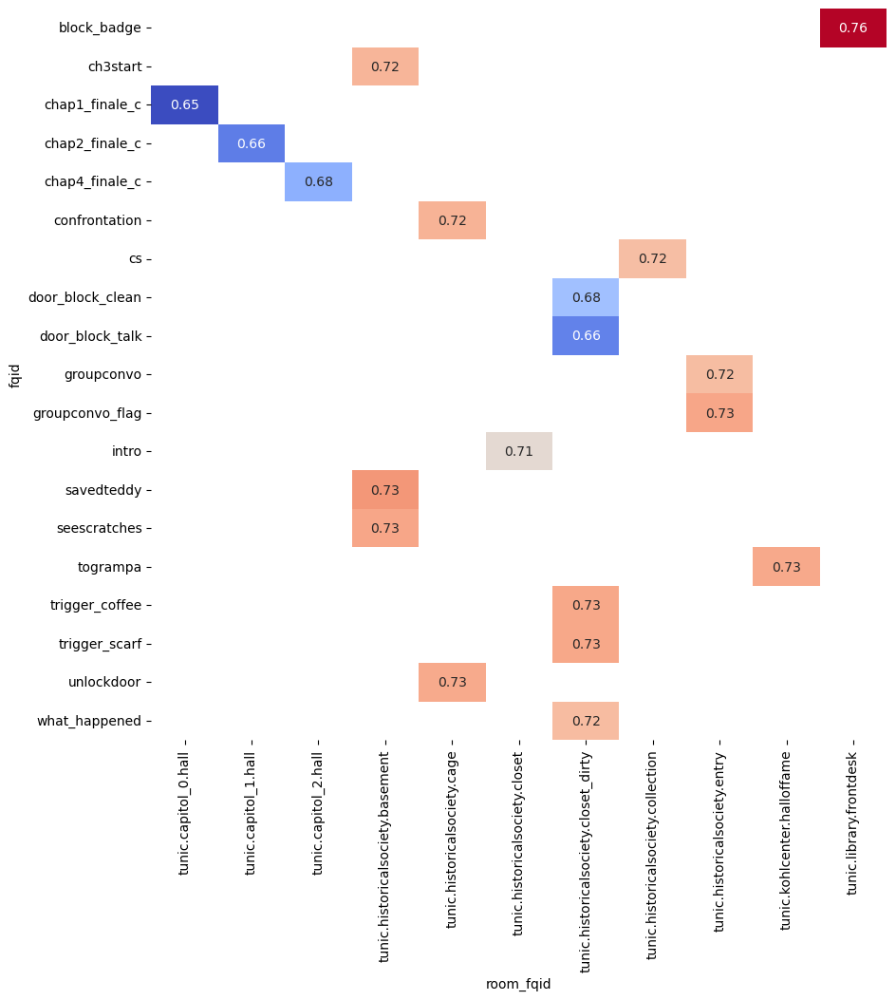

In [319]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap__count(df__cutscene_click, col_pair, COUNT_THRES, figsize=(10, 10))
plot_heatmap(get_heatmap_values(df__cutscene_click, col_pair, COUNT_THRES), figsize=(10, 10))

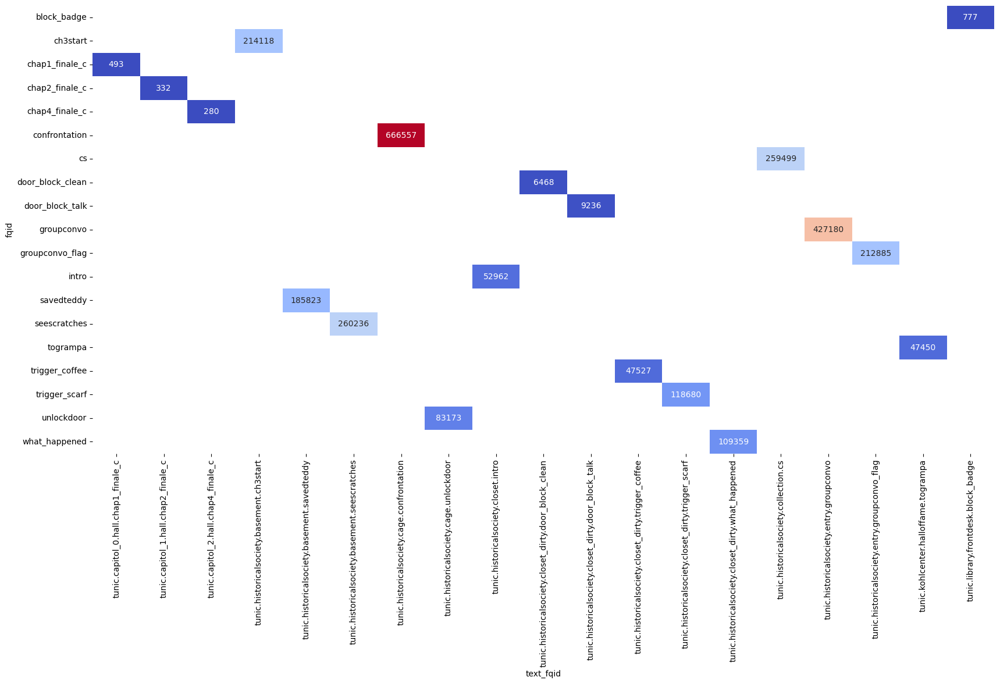

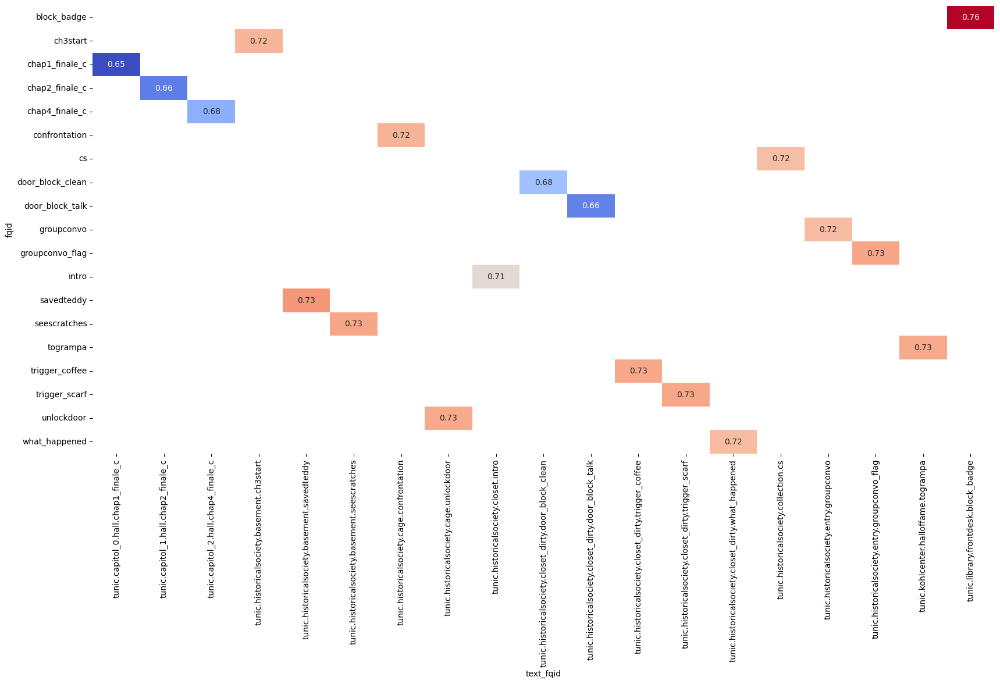

In [321]:
col_pair = ["fqid", "text_fqid"]
plot_heatmap__count(df__cutscene_click, col_pair, COUNT_THRES, figsize=(20, 10))
plot_heatmap(get_heatmap_values(df__cutscene_click, col_pair, COUNT_THRES), figsize=(20, 10))

`text_fqid` will be flagged

## `event_name` == `"map_click"`

In [323]:
df__map_click = train_data[train_data["event_name"] == "cutscene_click"].reset_index(drop=True)
df__map_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,level_group
0,20090312431273200,0,0,cutscene_click,basic,0.0,NaN,-414.0000,-159.37500,380.0,494.0,NaN,undefined,intro,tunic.historicalsociety.closet,tunic.historicalsociety.closet.intro,0,0,1,0-4
1,20090312431273200,41,45062,cutscene_click,basic,1.0,NaN,93.8125,-60.34375,338.0,368.0,NaN,Let's get started. The Wisconsin Wonders exhib...,groupconvo,tunic.historicalsociety.entry,tunic.historicalsociety.entry.groupconvo,0,0,1,0-4
2,20090312431273200,42,46046,cutscene_click,basic,1.0,NaN,134.0000,-85.68750,390.0,386.0,NaN,Who wants to investigate the shirt artifact?,groupconvo,tunic.historicalsociety.entry,tunic.historicalsociety.entry.groupconvo,0,0,1,0-4
3,20090312431273200,43,47362,cutscene_click,basic,1.0,NaN,125.9375,-83.37500,390.0,385.0,NaN,Not Leopold here. He's been losing papers lately.,groupconvo,tunic.historicalsociety.entry,tunic.historicalsociety.entry.groupconvo,0,0,1,0-4
4,20090312431273200,44,48112,cutscene_click,basic,1.0,NaN,123.6875,-80.06250,389.0,383.0,NaN,Hey!,groupconvo,tunic.historicalsociety.entry,tunic.historicalsociety.entry.groupconvo,0,0,1,0-4


#### Update Category Fields

In [324]:
df__map_click = add_question_labels(df__map_click, train_labels, 1)
df__map_click = recategorize_category_typed_fields(df__map_click)

In [325]:
summary = summarize_data_info(df__map_click)
summary

Data Shape: (2703035, 21)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,3583,0,41,42,0.0,19407.0
elapsed_time,int32,0.0,1528317,0,45062,46046,0.0,1988105886.0
event_name,category,0.0,1,cutscene_click,cutscene_click,cutscene_click,NaN,NaN
name,category,0.0,1,basic,basic,basic,NaN,NaN
level,float16,0.0,14,0.0,1.0,1.0,0.0,22.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,21727,-414.0,93.8125,134.0,-1419.0,949.0
room_coor_y,float16,0.0,19919,-159.375,-60.34375,-85.6875,-532.0,543.5
screen_coor_x,float16,0.0,4428,380.0,338.0,390.0,0.0,1886.0


In [326]:
df__map_click["name"].value_counts()

basic    2703035
Name: name, dtype: int64

#### Insights

- `name` field has three values (basic, undefined, closed).
- `text` field is constant (undefined).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

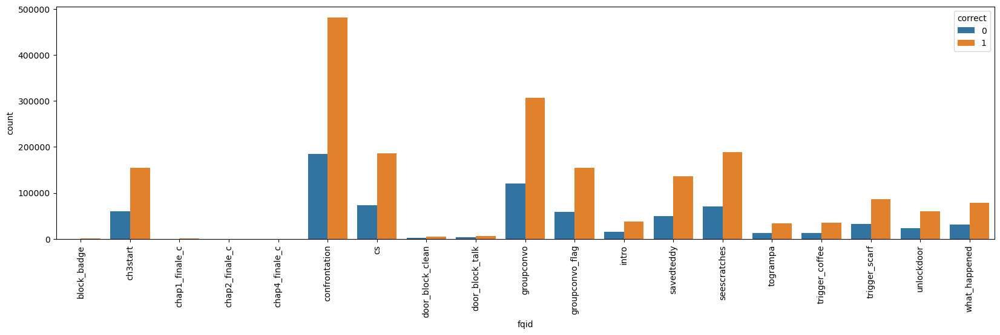

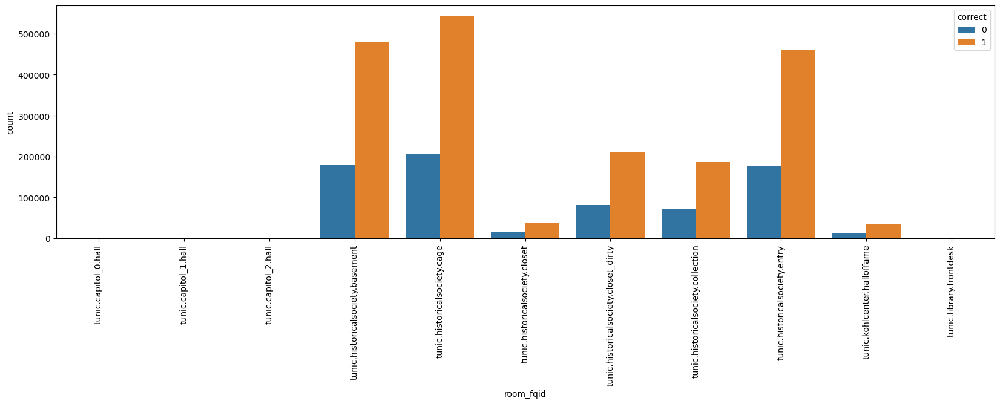

In [327]:
cat_fields_list = ["fqid", "room_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__map_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

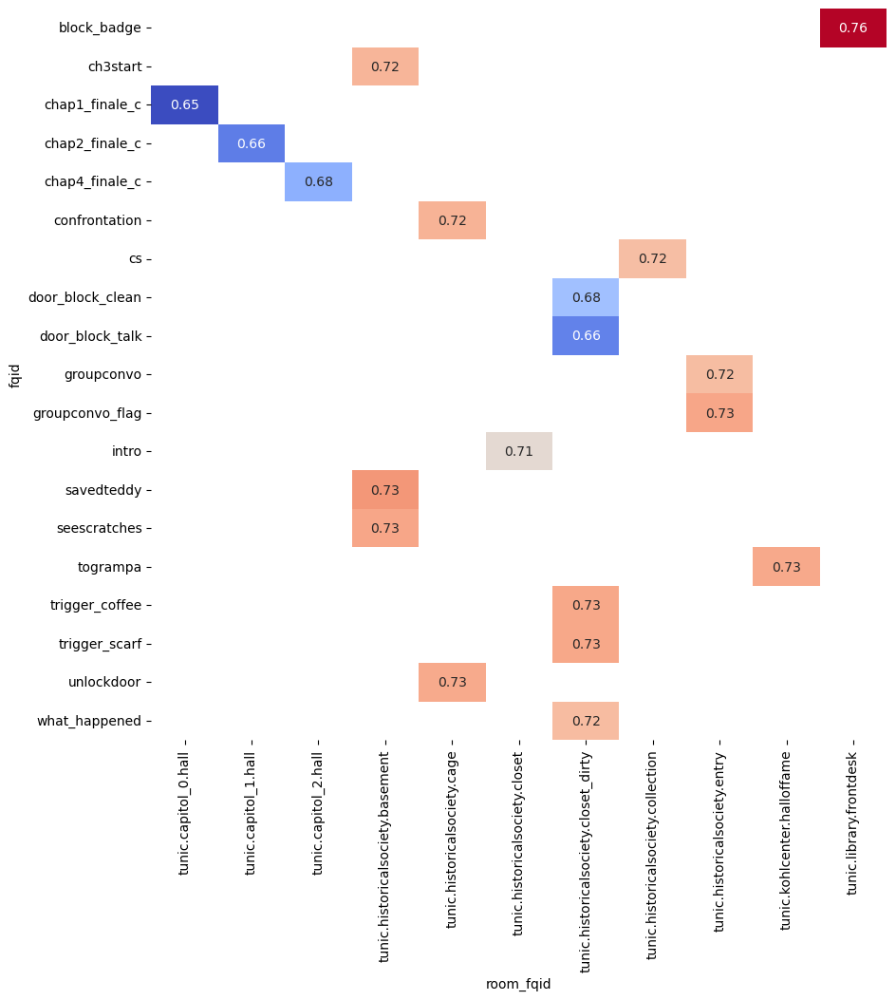

In [329]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__map_click, col_pair, COUNT_), figsize=(10, 10))

## `event_name` == `"map_hover"`

In [52]:
df__map_hover = df[df["event_name"] == "map_hover"].reset_index(drop=True)
df__map_hover.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,127,135124,map_hover,basic,3.0,NaN,NaN,NaN,NaN,NaN,234.0,undefined,tunic.historicalsociety,tunic.historicalsociety.entry,NaN,0,0,1,1
1,20090312431273200,128,135256,map_hover,basic,3.0,NaN,NaN,NaN,NaN,NaN,17.0,undefined,tunic.kohlcenter,tunic.historicalsociety.entry,NaN,0,0,1,1
2,20090312431273200,160,161405,map_hover,basic,4.0,NaN,NaN,NaN,NaN,NaN,250.0,undefined,toentry,tunic.kohlcenter.halloffame,NaN,0,0,1,1
3,20090312431273200,161,161822,map_hover,basic,4.0,NaN,NaN,NaN,NaN,NaN,17.0,undefined,tunic.kohlcenter,tunic.kohlcenter.halloffame,NaN,0,0,1,1
4,20090312433251036,101,161157,map_hover,basic,3.0,NaN,NaN,NaN,NaN,NaN,517.0,undefined,tomap,tunic.historicalsociety.entry,NaN,0,0,0,0


#### Update Category Fields

In [53]:
df__map_hover = recategorize_category_typed_fields(df__map_hover)

In [54]:
summary = summarize_data_info(df__map_hover)
summary

Data Shape: (45130, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,19330,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,1001,127,128,160,0.0,3701.0
elapsed_time,int32,0.0,42053,135124,135256,161405,16.0,1986894774.0
event_name,category,0.0,1,map_hover,map_hover,map_hover,NaN,NaN
name,category,0.0,1,basic,basic,basic,NaN,NaN
level,float16,0.0,2,3.0,3.0,4.0,3.0,4.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_y,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
screen_coor_x,float16,1.0,0,NaN,NaN,NaN,NaN,NaN


#### Insights

- `name` field is constant (basic).
- `text` field is constant (undefined).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `room_coor_x`
    - `room_coor_y`
    - `screen_coor_x`
    - `screen_coor_y`

#### Categorical Fields

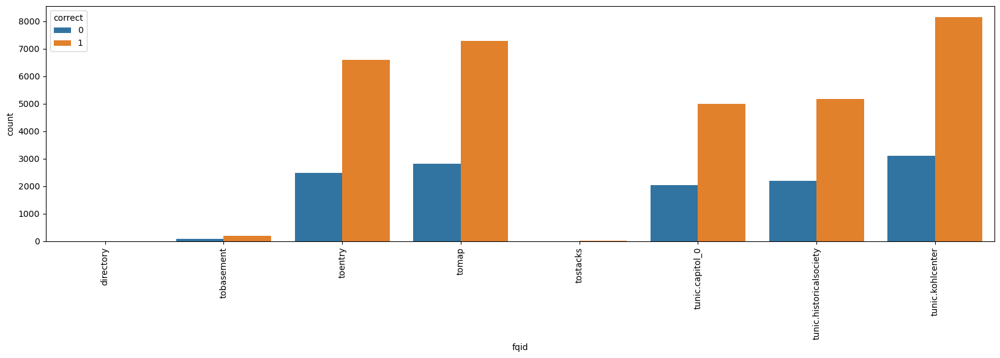

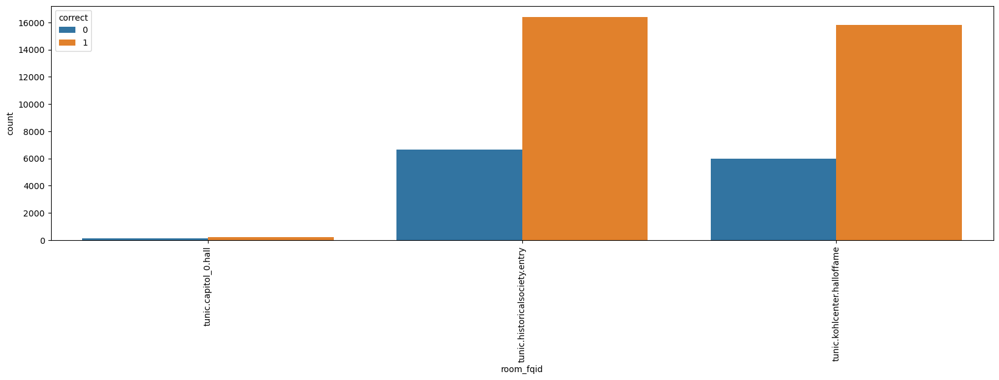

In [55]:
cat_fields_list = ["fqid", "room_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__map_hover, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

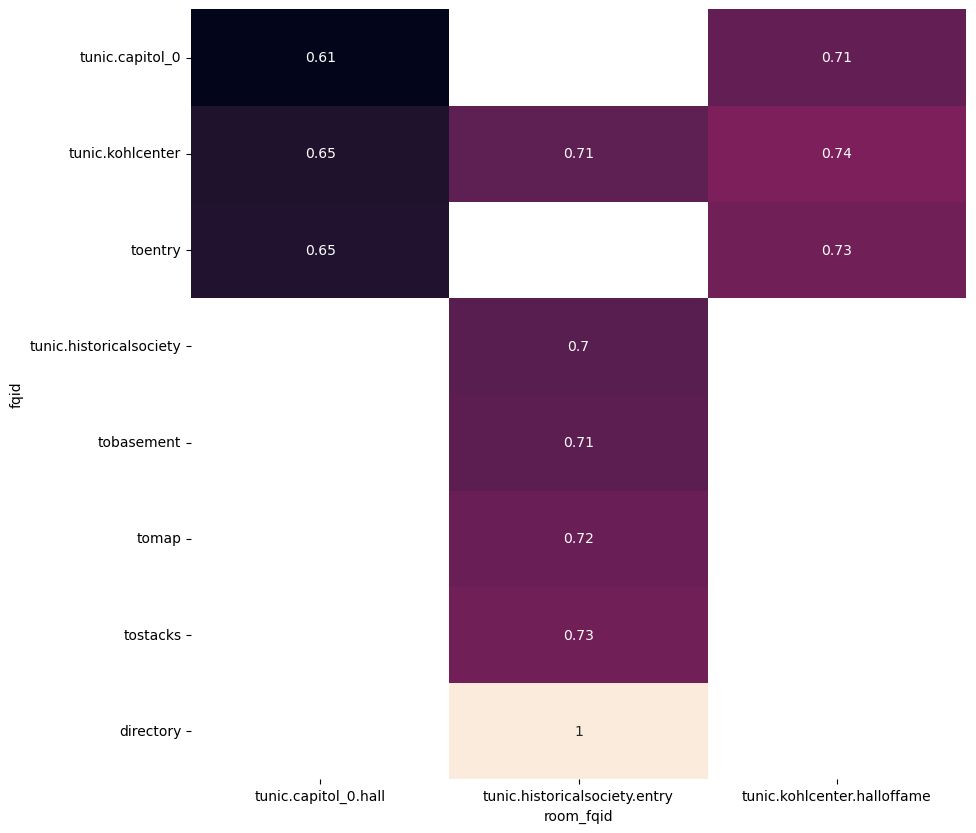

In [56]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__map_hover, col_pair), figsize=(10, 10))

## `event_name` == `"navigate_click"`

In [57]:
df__navigate_click = df[df["event_name"] == "navigate_click"].reset_index(drop=True)
df__navigate_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,10,9133,navigate_click,undefined,0.0,NaN,501.000000,-160.750,605.0,445.0,NaN,undefined,teddy,tunic.historicalsociety.closet,NaN,0,0,1,1
1,20090312431273200,12,12030,navigate_click,undefined,0.0,NaN,510.000000,-106.375,614.0,386.0,NaN,undefined,photo,tunic.historicalsociety.closet,NaN,0,0,1,1
2,20090312431273200,14,14814,navigate_click,undefined,0.0,NaN,274.000000,-196.750,406.0,486.0,NaN,undefined,NaN,tunic.historicalsociety.closet,NaN,0,0,1,1
3,20090312431273200,15,15498,navigate_click,undefined,0.0,NaN,185.750000,-205.750,363.0,492.0,NaN,undefined,NaN,tunic.historicalsociety.closet,NaN,0,0,1,1
4,20090312431273200,16,16046,navigate_click,undefined,0.0,NaN,0.583496,-225.750,234.0,510.0,NaN,undefined,NaN,tunic.historicalsociety.closet,NaN,0,0,1,1


#### Update Category Fields

In [58]:
df__navigate_click = recategorize_category_typed_fields(df__navigate_click)

In [59]:
summary = summarize_data_info(df__navigate_click)
summary

Data Shape: (1807806, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,3162,10,12,14,0.0,5134.0
elapsed_time,int32,0.0,440016,9133,12030,14814,0.0,1986899034.0
event_name,category,0.0,1,navigate_click,navigate_click,navigate_click,NaN,NaN
name,category,0.0,1,undefined,undefined,undefined,NaN,NaN
level,float16,0.0,5,0.0,0.0,0.0,0.0,4.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,22024,501.0,510.0,274.0,-1218.0,1172.0
room_coor_y,float16,0.0,19530,-160.75,-106.375,-196.75,-591.5,536.5
screen_coor_x,float16,0.0,5211,605.0,614.0,406.0,0.0,1914.0


#### Insights

- `name` field is constant (undefined).
- `text` field is constant (undefined).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

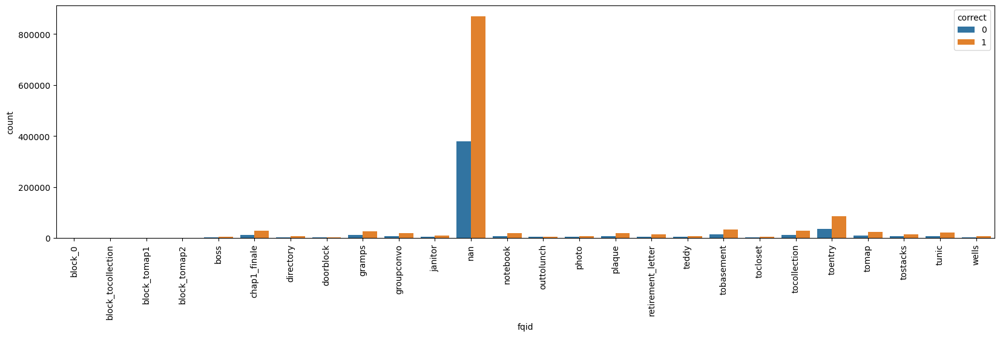

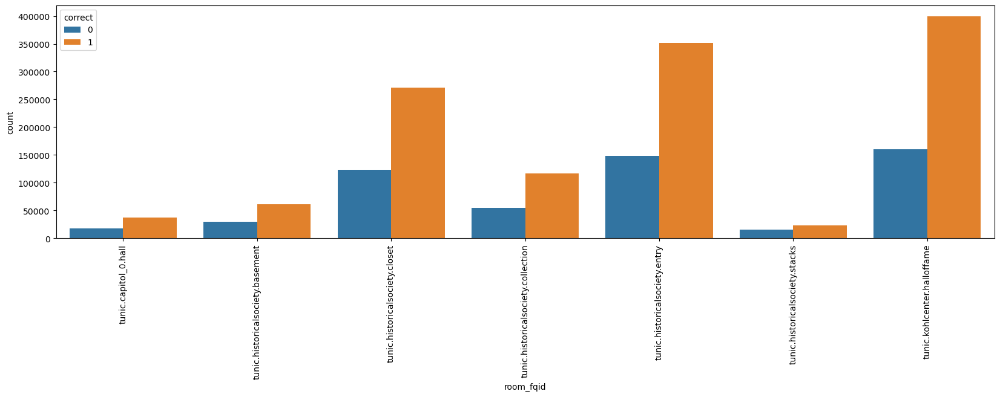

In [60]:
cat_fields_list = ["fqid", "room_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__navigate_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

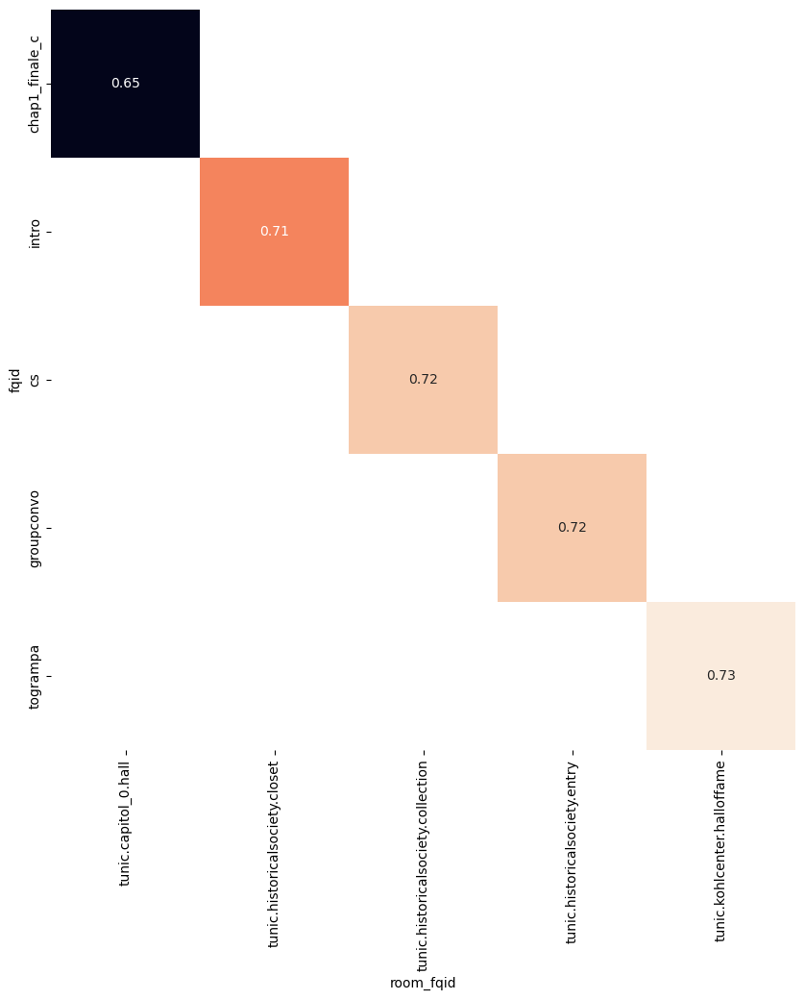

In [61]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__cutscene_click, col_pair), figsize=(10, 10))

## `event_name` == `"notebook_click"`

In [62]:
df__notebook_click = df[df["event_name"] == "notebook_click"].reset_index(drop=True)
df__notebook_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312433251036,60,60743,notebook_click,open,2.0,0.0,-1112.00,-518.50,30.0,639.0,NaN,undefined,NaN,tunic.historicalsociety.entry,NaN,0,0,0,0
1,20090312433251036,61,61761,notebook_click,close,2.0,0.0,73.25,428.25,789.0,58.0,NaN,undefined,NaN,tunic.historicalsociety.entry,NaN,0,0,0,0
2,20090313091715820,123,80710,notebook_click,open,3.0,0.0,-564.00,-431.75,33.0,731.0,NaN,undefined,NaN,tunic.historicalsociety.collection,NaN,1,1,1,0
3,20090313091715820,124,82222,notebook_click,close,3.0,0.0,594.00,403.25,969.0,56.0,NaN,undefined,NaN,tunic.historicalsociety.collection,NaN,1,1,1,0
4,20090313571836404,47,72818,notebook_click,open,2.0,0.0,-481.00,-486.25,38.0,616.0,NaN,undefined,NaN,tunic.historicalsociety.entry,NaN,0,0,1,1


#### Update Category Fields

In [63]:
df__notebook_click = recategorize_category_typed_fields(df__notebook_click)

In [64]:
summary = summarize_data_info(df__notebook_click)
summary

Data Shape: (81733, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,13943,20090312433251036,20090312433251036,20090313091715820,20090312433251036.0,22100221145014656.0
index,int16,0.0,1262,60,61,123,0.0,2858.0
elapsed_time,int32,0.0,72223,60743,61761,80710,9183.0,1747004800.0
event_name,category,0.0,1,notebook_click,notebook_click,notebook_click,NaN,NaN
name,category,0.0,5,open,close,open,NaN,NaN
level,float16,0.0,4,2.0,2.0,3.0,1.0,4.0
page,float16,0.0,2,0.0,0.0,0.0,0.0,1.0
room_coor_x,float16,0.0,8913,-1112.0,73.25,-564.0,-1182.0,1140.0
room_coor_y,float16,0.0,5529,-518.5,428.25,-431.75,-560.5,517.5
screen_coor_x,float16,0.0,1854,30.0,789.0,33.0,0.0,1919.0


In [65]:
df__notebook_click["name"].value_counts(dropna=False)

open     33179
close    33174
basic    13863
prev      1007
next       510
Name: name, dtype: int64

In [66]:
df__notebook_click["page"].value_counts(dropna=False)

0.0    65446
1.0    16287
Name: page, dtype: int64

#### Insights

- `name` field has 5 different values (open, close, basic, prev, next).
- `page` field has 4 different values (0, 1, 2, 3).
- `text` field is constant (undefined).
- `fqid` field is constant (nan).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `hover_duration`

#### Categorical Fields

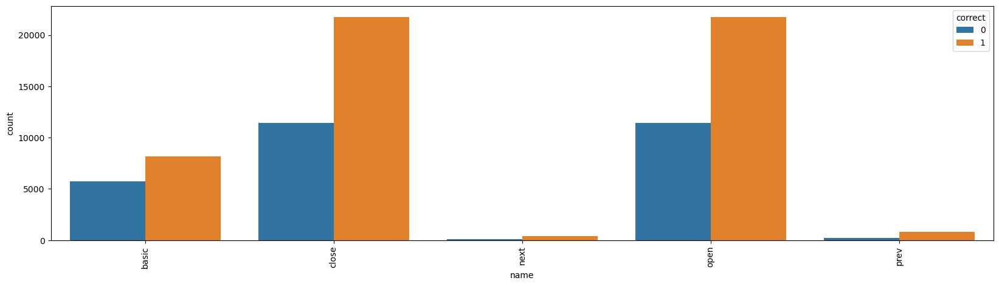

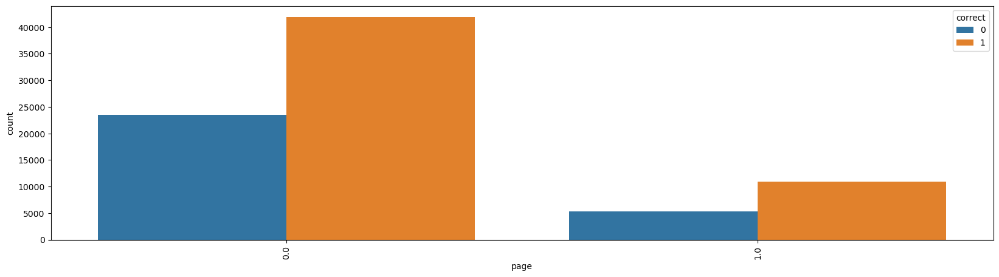

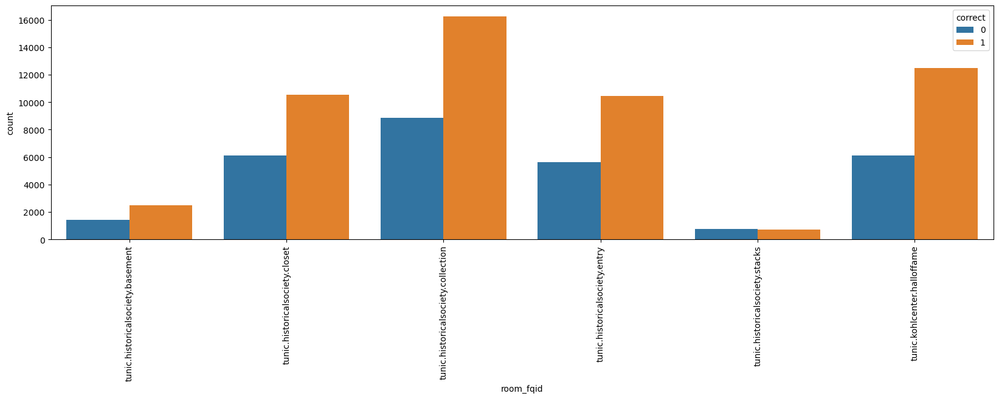

In [67]:
cat_fields_list = ["name", "page", "room_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__notebook_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

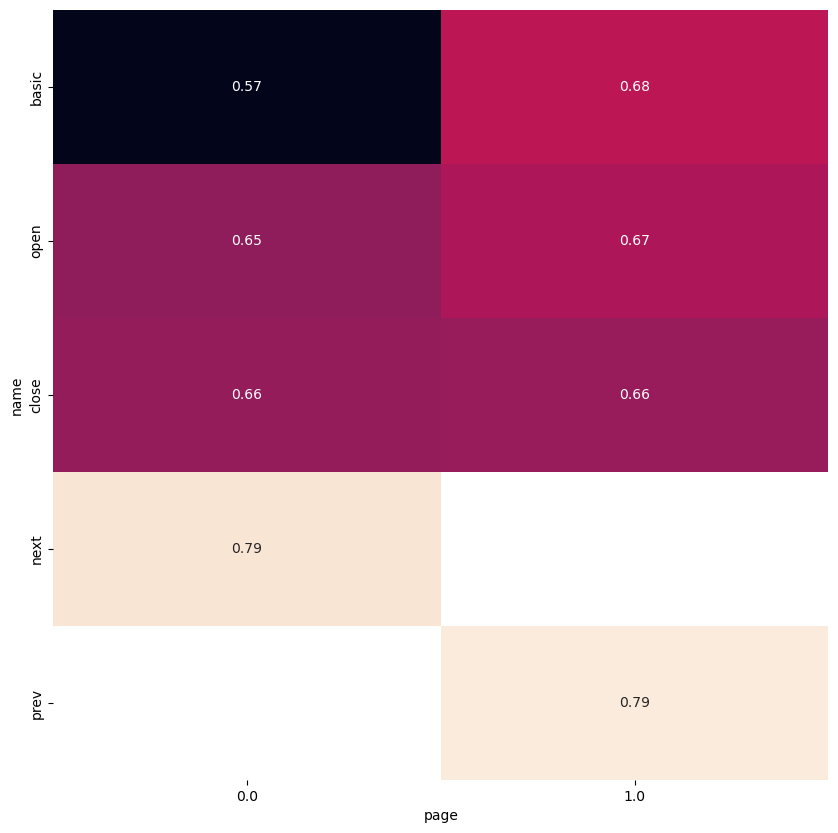

In [68]:
col_pair = ["name", "page"]
plot_heatmap(get_heatmap_values(df__notebook_click, col_pair), figsize=(10, 10))

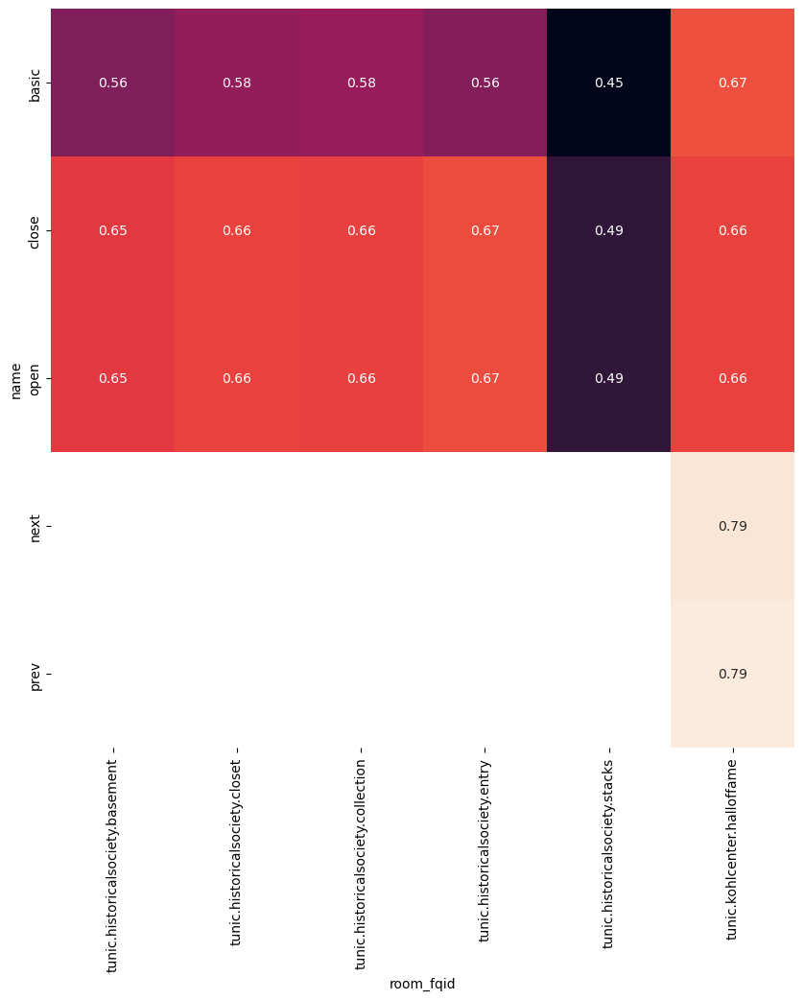

In [69]:
col_pair = ["name", "room_fqid"]
plot_heatmap(get_heatmap_values(df__notebook_click, col_pair), figsize=(10, 10))

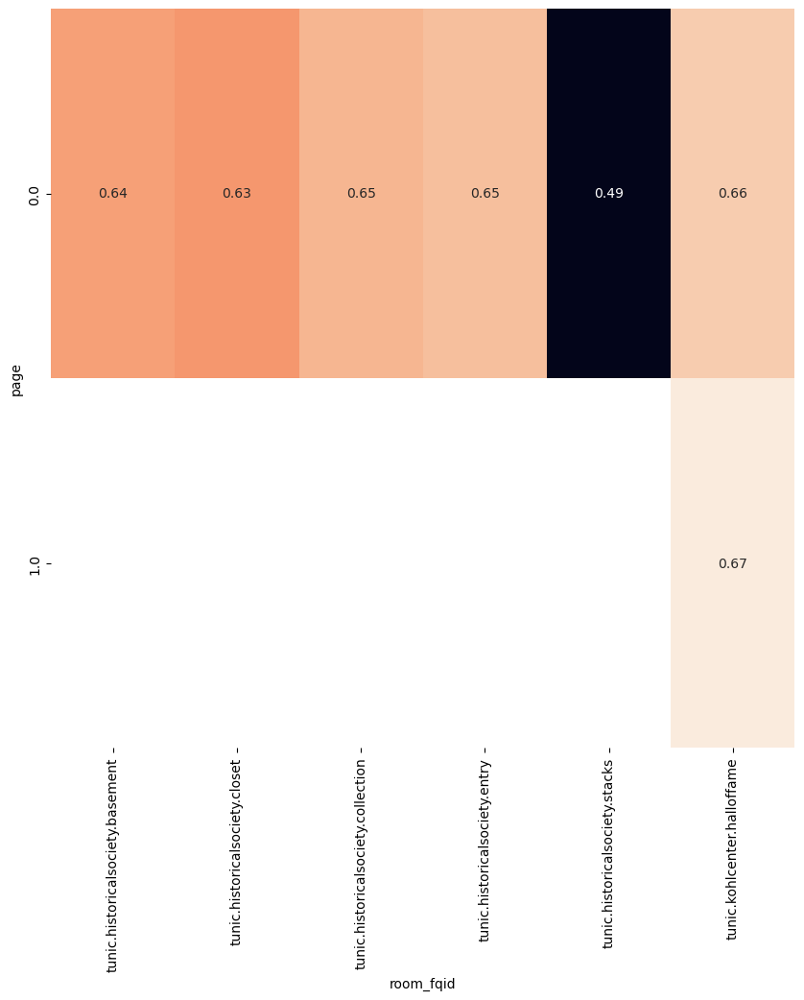

In [70]:
col_pair = ["page", "room_fqid"]
plot_heatmap(get_heatmap_values(df__notebook_click, col_pair), figsize=(10, 10))

## `event_name` == `"notification_click"`

In [71]:
df__notification_click = df[df["event_name"] == "notification_click"].reset_index(drop=True)
df__notification_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,26,24348,notification_click,basic,0.0,NaN,-472.250,-117.93750,554.0,394.0,NaN,Found it!,NaN,tunic.historicalsociety.closet,tunic.historicalsociety.closet.notebook,0,0,1,1
1,20090312431273200,29,32229,notification_click,basic,1.0,NaN,-182.500,-1.90625,767.0,305.0,NaN,Gramps is in trouble for losing papers?,NaN,tunic.historicalsociety.closet,tunic.historicalsociety.closet.retirement_lett...,0,0,1,1
2,20090312431273200,30,33063,notification_click,basic,1.0,NaN,-182.500,-55.87500,767.0,359.0,NaN,This can't be right!,NaN,tunic.historicalsociety.closet,tunic.historicalsociety.closet.retirement_lett...,0,0,1,1
3,20090312431273200,31,34245,notification_click,basic,1.0,NaN,-182.500,-55.87500,767.0,359.0,NaN,Gramps is a great historian!,NaN,tunic.historicalsociety.closet,tunic.historicalsociety.closet.retirement_lett...,0,0,1,1
4,20090312431273200,85,89809,notification_click,basic,2.0,NaN,-86.875,-96.81250,355.0,397.0,NaN,This looks like a clue!,NaN,tunic.historicalsociety.collection,tunic.historicalsociety.collection.tunic.slip,0,0,1,1


#### Update Category Fields

In [72]:
df__notification_click = recategorize_category_typed_fields(df__notification_click)

In [73]:
summary = summarize_data_info(df__notification_click)
summary

Data Shape: (183243, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,1864,26,29,30,0.0,5104.0
elapsed_time,int32,0.0,129241,24348,32229,33063,229.0,1986886387.0
event_name,category,0.0,1,notification_click,notification_click,notification_click,NaN,NaN
name,category,0.0,1,basic,basic,basic,NaN,NaN
level,float16,0.0,4,0.0,1.0,1.0,0.0,3.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,9947,-472.25,-182.5,-182.5,-1022.5,873.0
room_coor_y,float16,0.0,9803,-117.9375,-1.90625,-55.875,-475.25,470.25
screen_coor_x,float16,0.0,1877,554.0,767.0,767.0,0.0,1764.0


#### Insights

- `name` field is constant (basic).
- `fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

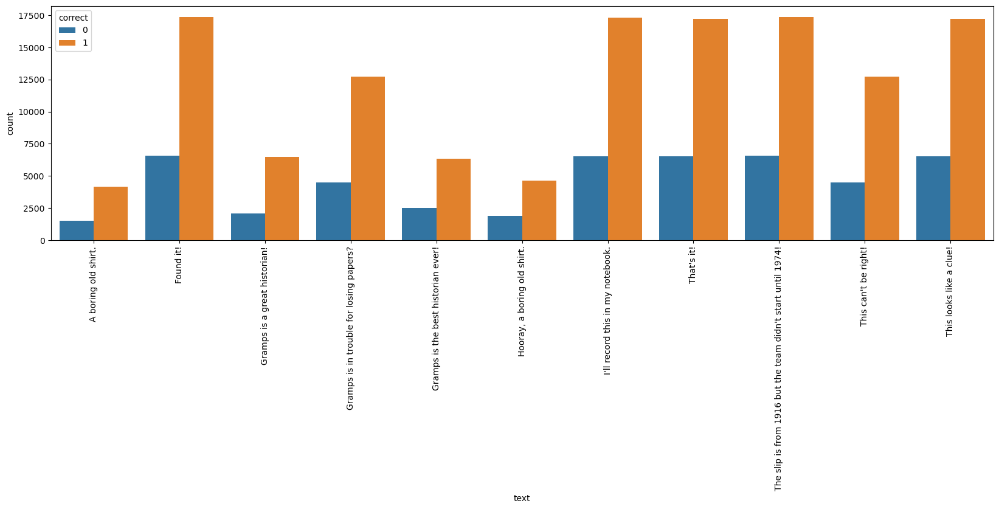

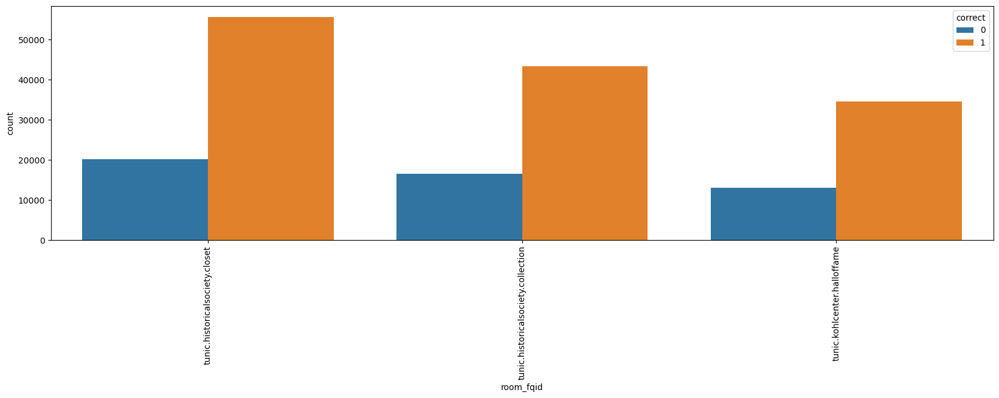

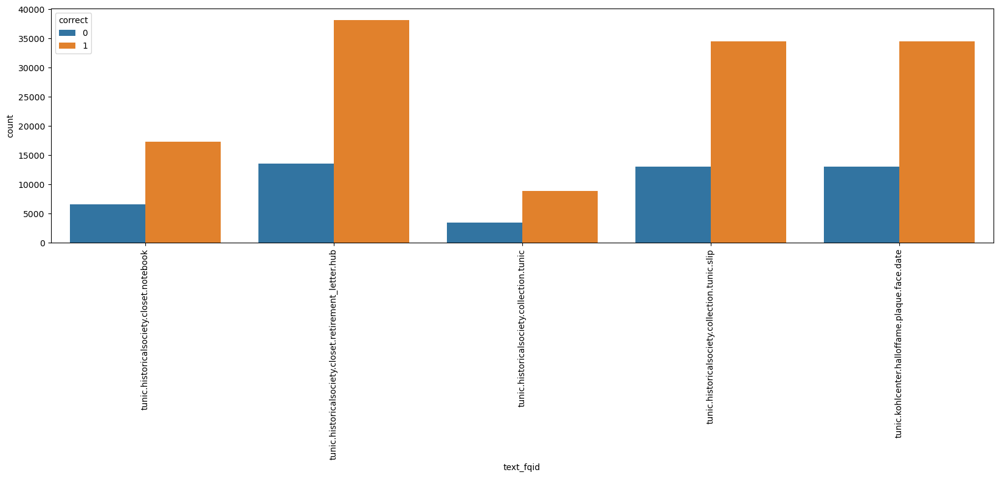

In [74]:
cat_fields_list = ["text", "room_fqid", "text_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__notification_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

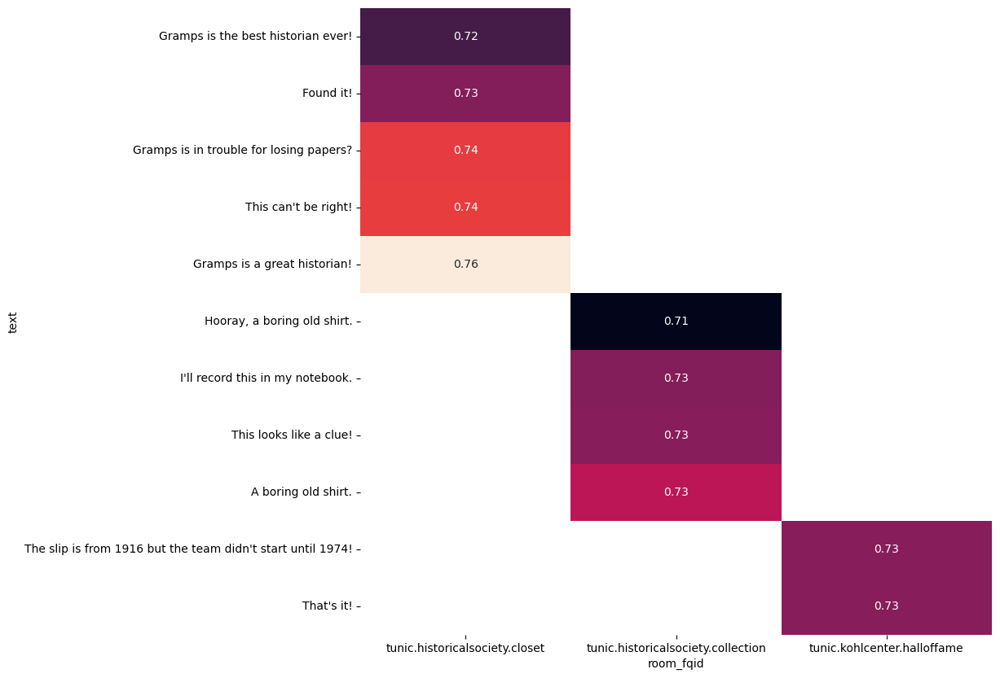

In [75]:
col_pair = ["text", "room_fqid"]
plot_heatmap(get_heatmap_values(df__notification_click, col_pair), figsize=(10, 10))

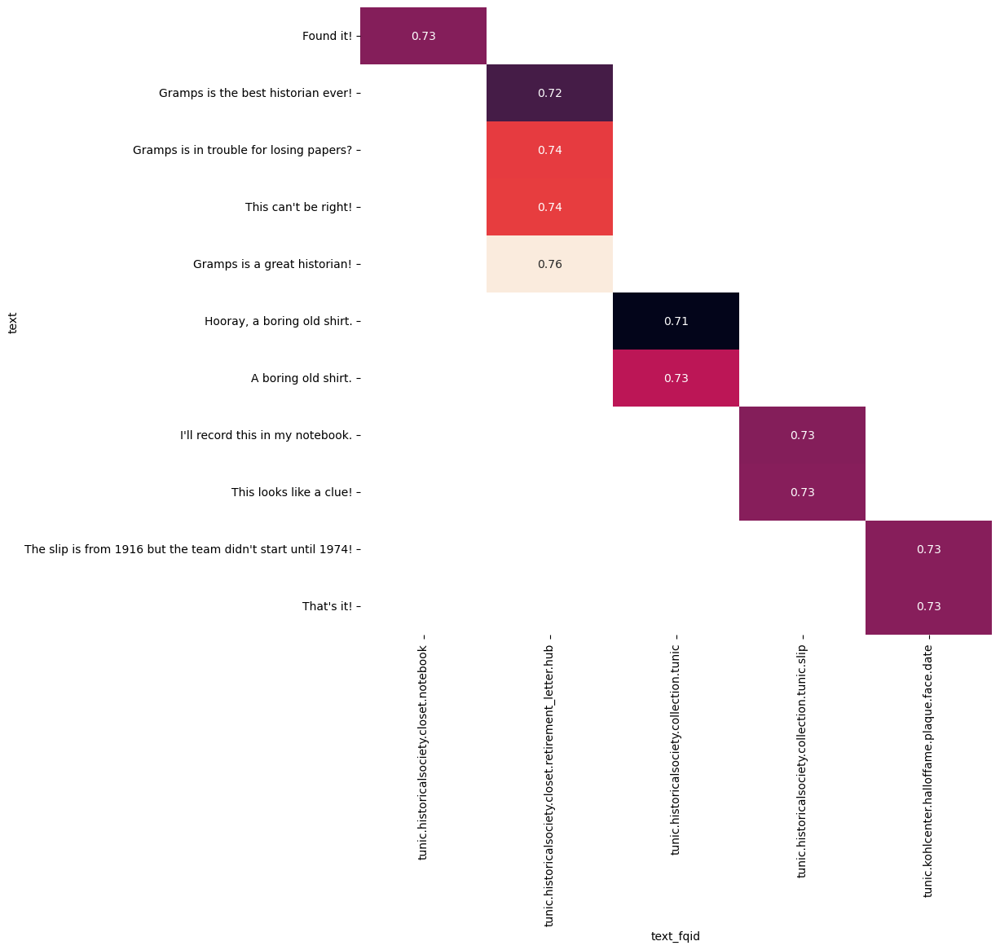

In [76]:
col_pair = ["text", "text_fqid"]
plot_heatmap(get_heatmap_values(df__notification_click, col_pair), figsize=(10, 10))

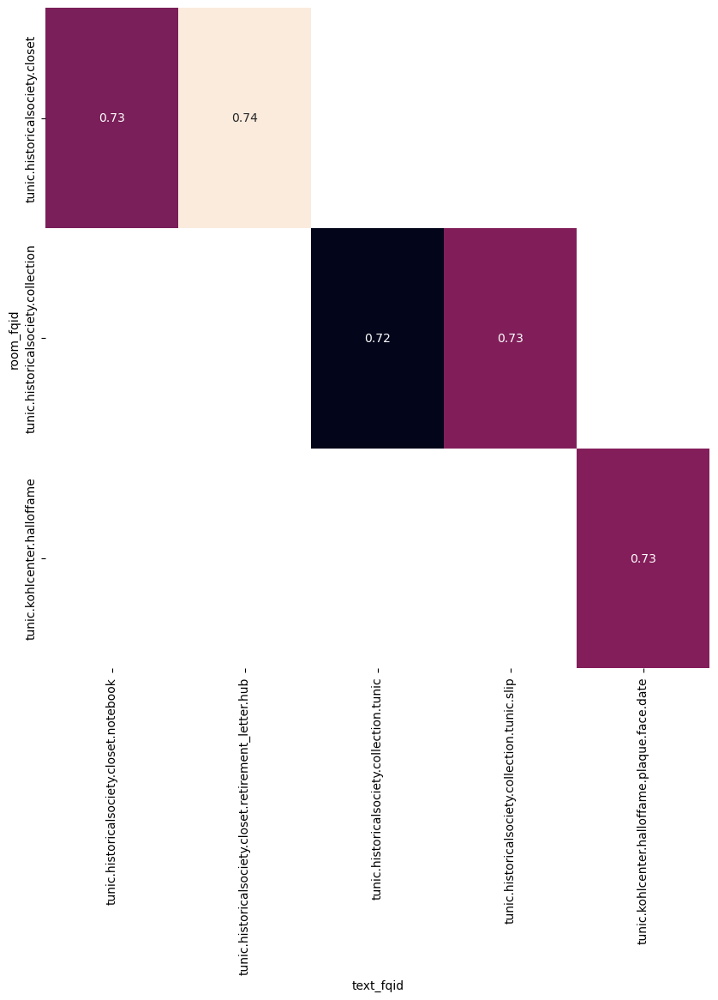

In [77]:
col_pair = ["room_fqid", "text_fqid"]
plot_heatmap(get_heatmap_values(df__notification_click, col_pair), figsize=(10, 10))

## `event_name` == `"object_click"`

In [78]:
df__object_click = df[df["event_name"] == "object_click"].reset_index(drop=True)
df__object_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,27,25766,object_click,close,0.0,NaN,-206.5,199.125,822.0,76.0,NaN,undefined,notebook,tunic.historicalsociety.closet,NaN,0,0,1,1
1,20090312431273200,32,36433,object_click,close,1.0,NaN,-113.5,241.125,836.0,62.0,NaN,undefined,retirement_letter,tunic.historicalsociety.closet,NaN,0,0,1,1
2,20090312431273200,50,57277,object_click,basic,1.0,NaN,856.5,69.750,839.0,291.0,NaN,undefined,report,tunic.historicalsociety.entry,NaN,0,0,1,1
3,20090312431273200,51,58244,object_click,close,1.0,NaN,848.0,402.000,834.0,87.0,NaN,undefined,report,tunic.historicalsociety.entry,NaN,0,0,1,1
4,20090312431273200,68,73927,object_click,close,2.0,NaN,439.0,416.000,833.0,74.0,NaN,undefined,directory,tunic.historicalsociety.entry,NaN,0,0,1,1


#### Update Category Fields

In [79]:
df__object_click = recategorize_category_typed_fields(df__object_click)

In [80]:
summary = summarize_data_info(df__object_click)
summary

Data Shape: (364862, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,2214,27,32,50,0.0,5105.0
elapsed_time,int32,0.0,232496,25766,36433,57277,10.0,1986888039.0
event_name,category,0.0,1,object_click,object_click,object_click,NaN,NaN
name,category,0.0,2,close,close,basic,NaN,NaN
level,float16,0.0,5,0.0,1.0,1.0,0.0,4.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,11720,-206.5,-113.5,856.5,-1020.5,923.0
room_coor_y,float16,0.0,10404,199.125,241.125,69.75,-523.5,543.5
screen_coor_x,float16,0.0,2914,822.0,836.0,839.0,0.0,1901.0


#### Insights

- `name` field has two values (basic, close).
- `text` field is constant (undefined).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

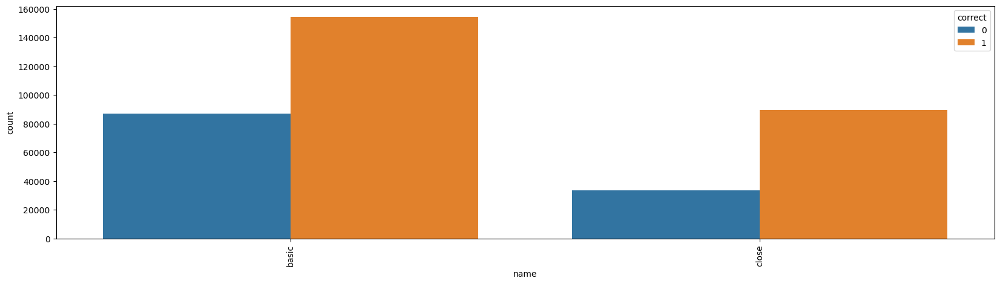

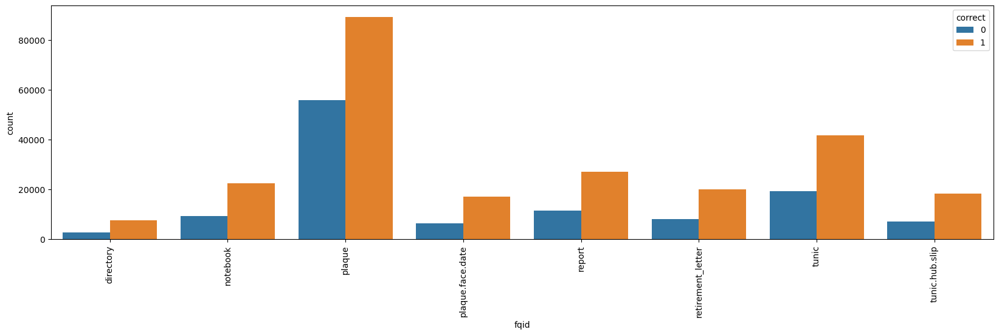

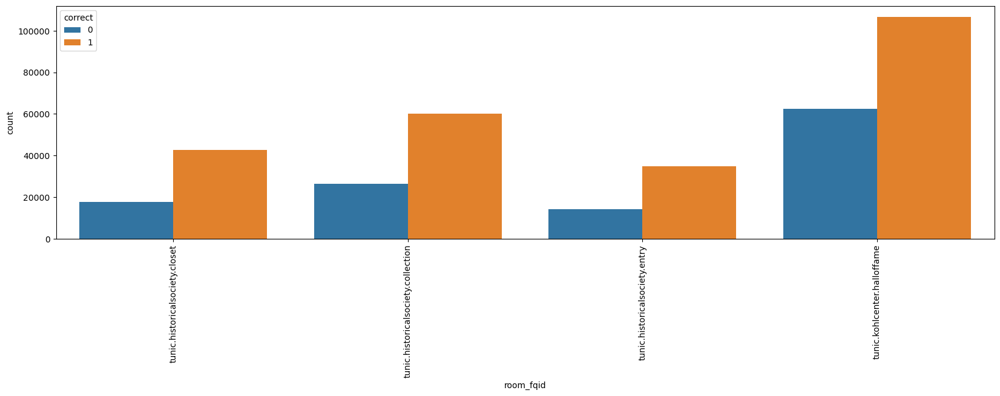

In [81]:
cat_fields_list = ["name", "fqid", "room_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__object_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

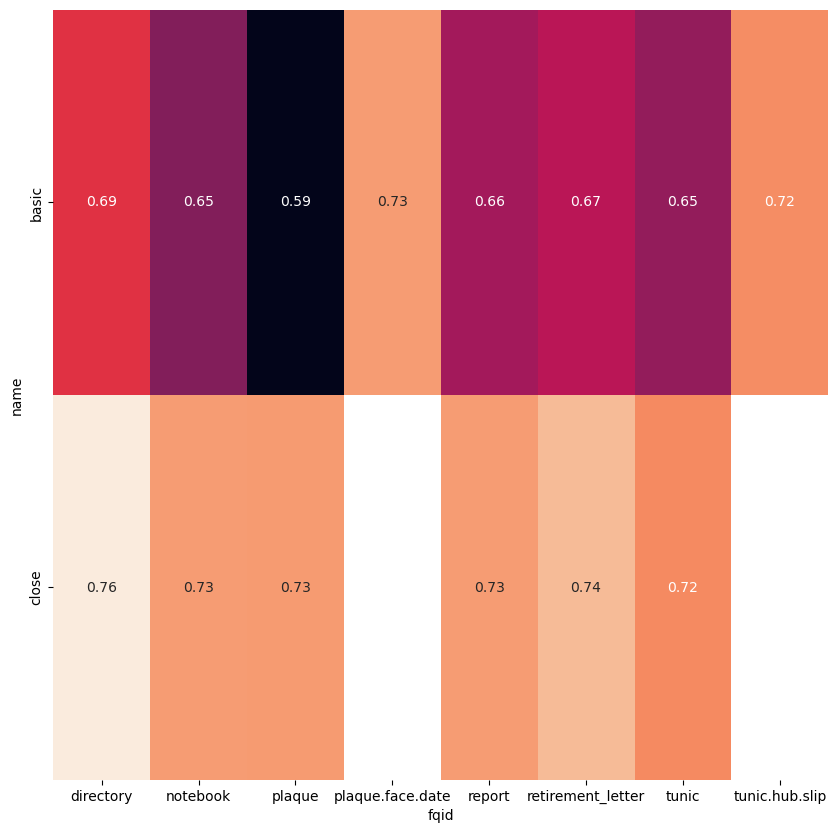

In [82]:
col_pair = ["name", "fqid"]
plot_heatmap(get_heatmap_values(df__object_click, col_pair), figsize=(10, 10))

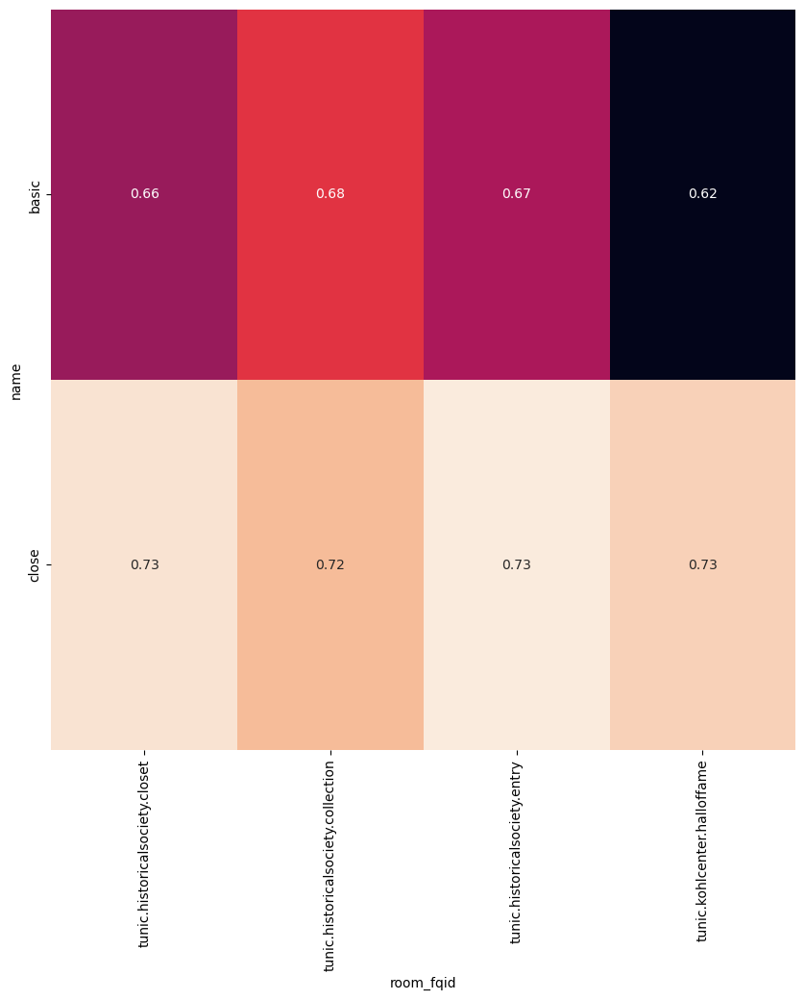

In [83]:
col_pair = ["name", "room_fqid"]
plot_heatmap(get_heatmap_values(df__object_click, col_pair), figsize=(10, 10))

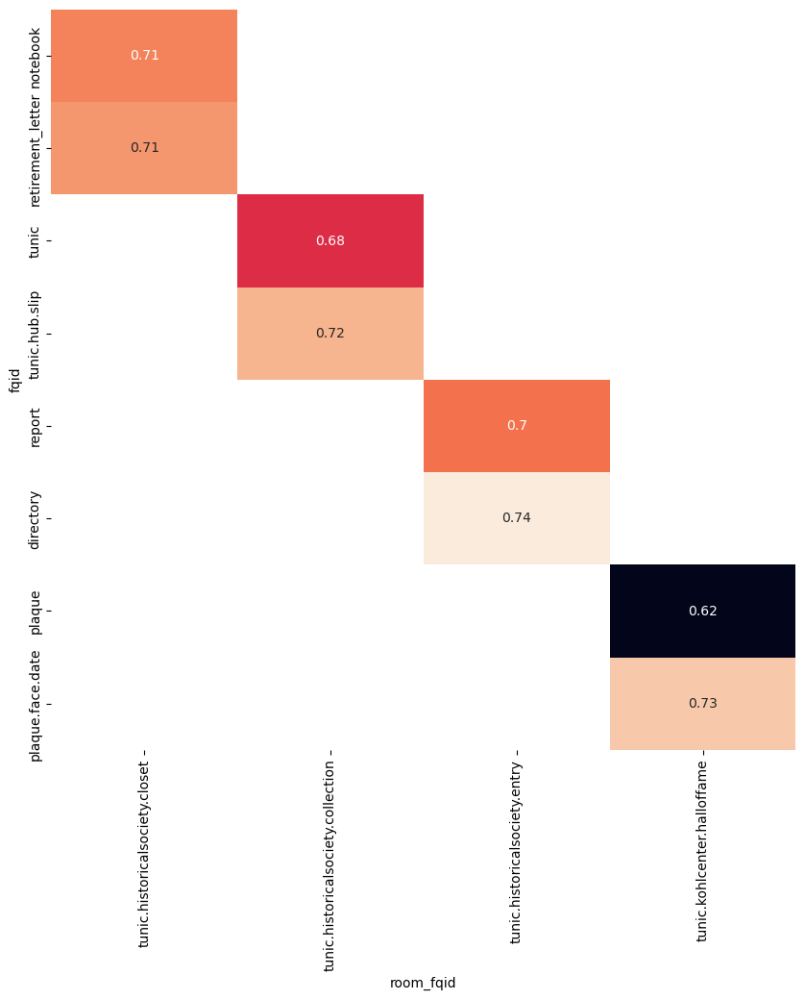

In [84]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__object_click, col_pair), figsize=(10, 10))

## `event_name` == `"object_hover"`

In [85]:
df__object_hover = df[df["event_name"] == "object_hover"].reset_index(drop=True)
df__object_hover.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,49,52328,object_hover,basic,1.0,NaN,NaN,NaN,NaN,NaN,7899.0,undefined,groupconvo,tunic.historicalsociety.entry,NaN,0,0,1,1
1,20090312431273200,82,87242,object_hover,basic,2.0,NaN,NaN,NaN,NaN,NaN,400.0,undefined,tunic,tunic.historicalsociety.collection,NaN,0,0,1,1
2,20090312431273200,87,92242,object_hover,undefined,2.0,NaN,NaN,NaN,NaN,NaN,3949.0,undefined,tunic.hub.slip,tunic.historicalsociety.collection,NaN,0,0,1,1
3,20090312431273200,148,153655,object_hover,undefined,3.0,NaN,NaN,NaN,NaN,NaN,6350.0,undefined,plaque.face.date,tunic.kohlcenter.halloffame,NaN,0,0,1,1
4,20090312433251036,73,106194,object_hover,undefined,2.0,NaN,NaN,NaN,NaN,NaN,701.0,undefined,tunic.hub.slip,tunic.historicalsociety.collection,NaN,0,0,0,0


#### Update Category Fields

In [86]:
df__object_hover = recategorize_category_typed_fields(df__object_hover)

In [87]:
summary = summarize_data_info(df__object_hover)
summary

Data Shape: (107127, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,21689,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,1464,49,82,87,0.0,3680.0
elapsed_time,int32,0.0,91471,52328,87242,92242,543.0,1986887172.0
event_name,category,0.0,1,object_hover,object_hover,object_hover,NaN,NaN
name,category,0.0,2,basic,basic,undefined,NaN,NaN
level,float16,0.0,5,1.0,2.0,2.0,0.0,4.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_y,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
screen_coor_x,float16,1.0,0,NaN,NaN,NaN,NaN,NaN


#### Insights

- `name` field has two values (basic, undefined).
- `text` field is constant (undefined).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `room_coor_x`
    - `room_coor_y`
    - `screen_coor_x`
    - `screen_coor_y`

#### Categorical Fields

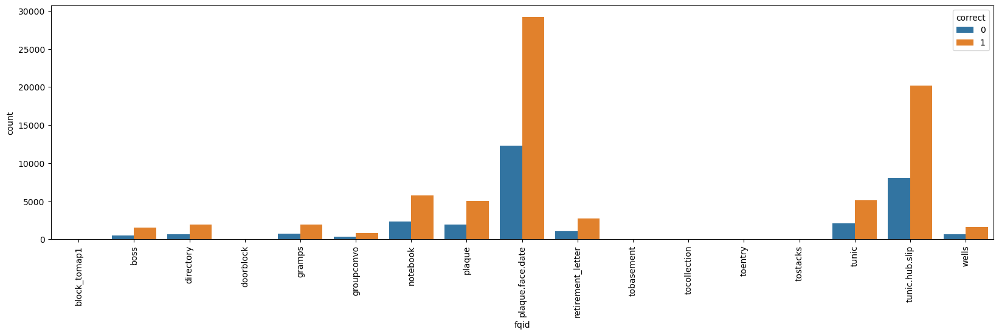

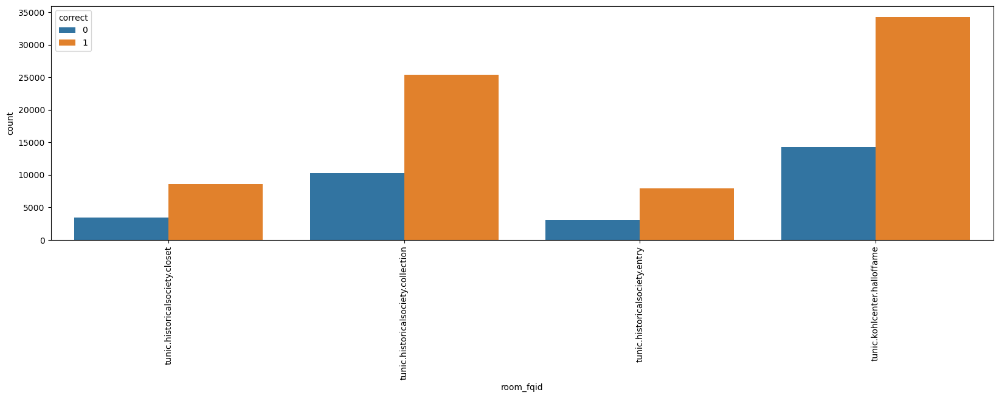

In [88]:
cat_fields_list = ["fqid", "room_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__object_hover, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

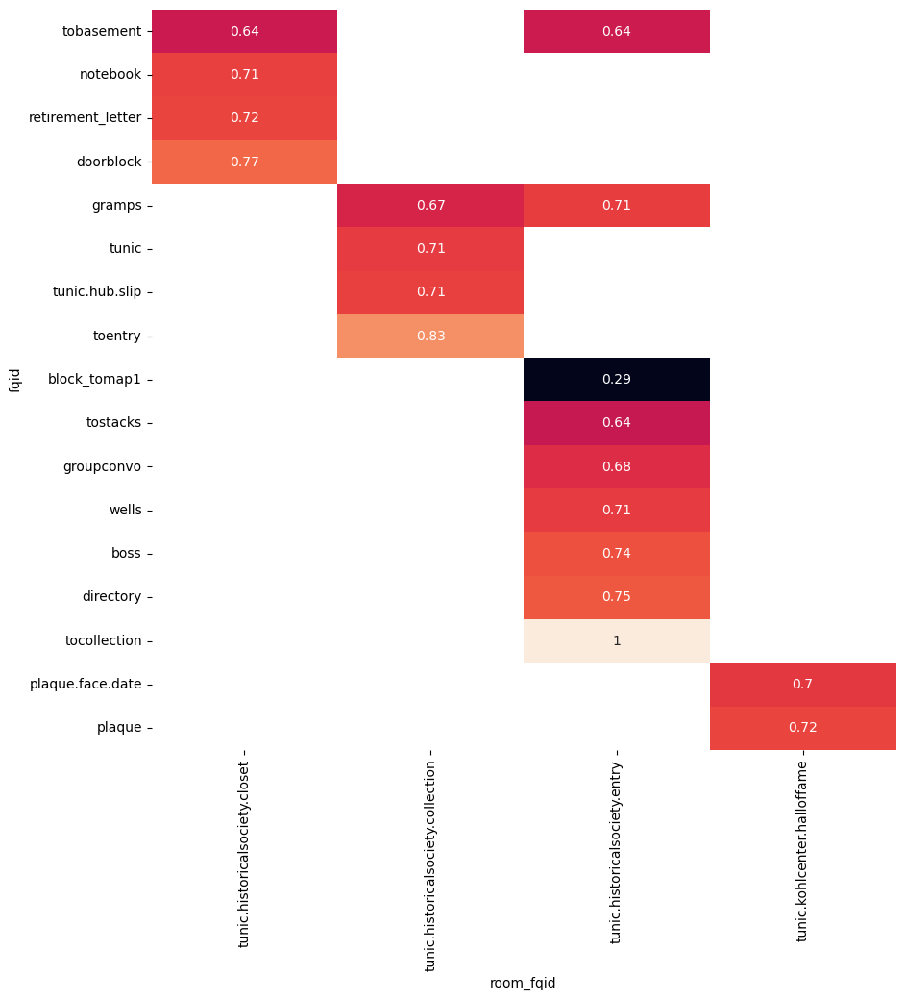

In [89]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__object_hover, col_pair), figsize=(10, 10))

## `event_name` == `"observation_click"`

In [90]:
df__observation_click = df[df["event_name"] == "observation_click"].reset_index(drop=True)
df__observation_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,13,13030,observation_click,basic,0.0,NaN,487.000000,-98.562500,614.0,386.0,NaN,I love these photos of me and Teddy!,photo,tunic.historicalsociety.closet,tunic.historicalsociety.closet.photo,0,0,1,1
1,20090312431273200,37,41297,observation_click,basic,1.0,NaN,-400.250000,-117.500000,179.0,405.0,NaN,Hmm. Button's still not working.,janitor,tunic.historicalsociety.basement,tunic.historicalsociety.basement.janitor,0,0,1,1
2,20090312431273200,108,109825,observation_click,basic,3.0,NaN,14.359375,-156.250000,444.0,485.0,NaN,Better check back later.,outtolunch,tunic.historicalsociety.stacks,tunic.historicalsociety.stacks.outtolunch,0,0,1,1
3,20090312431273200,112,117142,observation_click,basic,3.0,NaN,-7.492188,-61.718750,480.0,365.0,NaN,Hmm. Button's still not working.,janitor,tunic.historicalsociety.basement,tunic.historicalsociety.basement.janitor,0,0,1,1
4,20090312433251036,29,36447,observation_click,basic,1.0,NaN,-990.000000,2.251953,134.0,327.0,NaN,I should see what Grampa is up to!,block_tocollection,tunic.historicalsociety.entry,tunic.historicalsociety.entry.block_tocollection,0,0,0,0


#### Update Category Fields

In [91]:
df__observation_click = recategorize_category_typed_fields(df__observation_click)

In [92]:
summary = summarize_data_info(df__observation_click)
summary

Data Shape: (40850, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,15847,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,996,13,37,108,1.0,3598.0
elapsed_time,int32,0.0,36606,13030,41297,109825,1799.0,1746734366.0
event_name,category,0.0,1,observation_click,observation_click,observation_click,NaN,NaN
name,category,0.0,1,basic,basic,basic,NaN,NaN
level,float16,0.0,4,0.0,1.0,3.0,0.0,3.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,11288,487.0,-400.25,14.359375,-1199.0,1173.0
room_coor_y,float16,0.0,8410,-98.5625,-117.5,-156.25,-502.25,450.5
screen_coor_x,float16,0.0,1181,614.0,179.0,444.0,0.0,1726.0


#### Insights

- `name` field is constant (basic).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

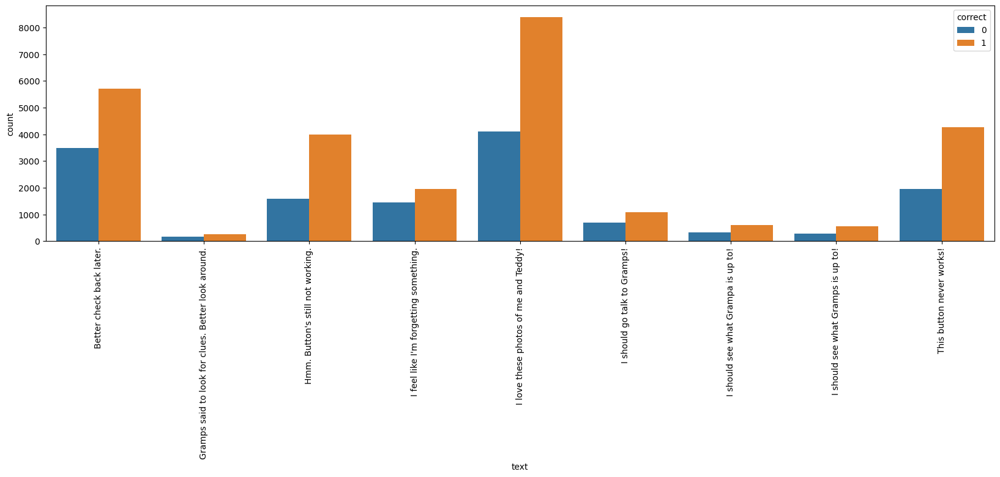

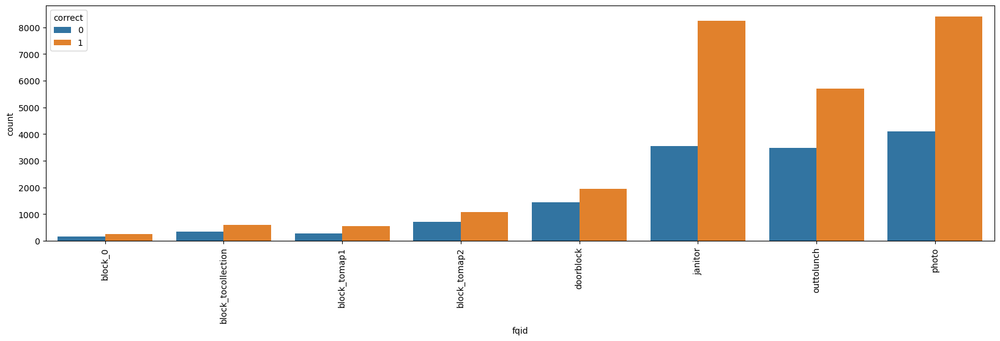

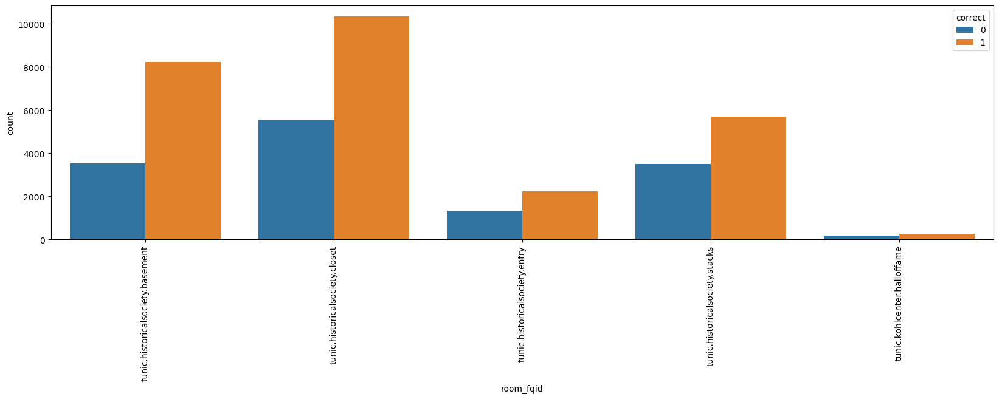

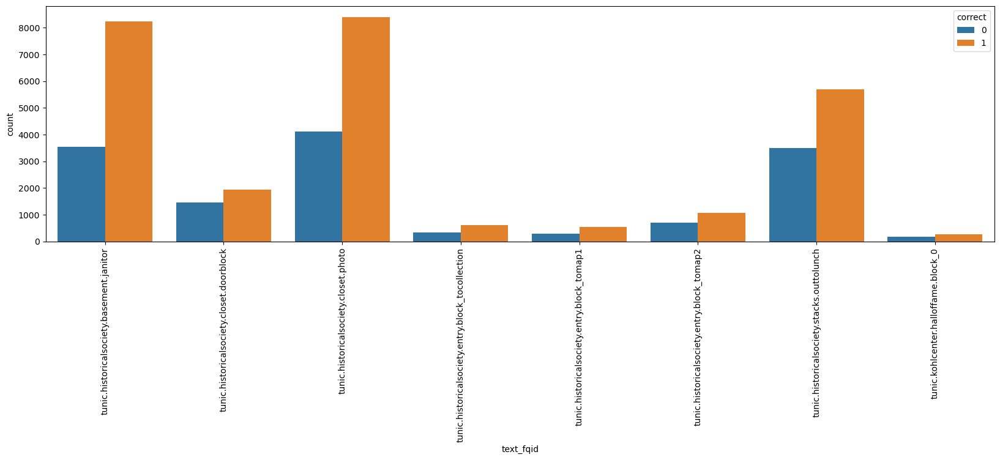

In [93]:
cat_fields_list = ["text", "fqid", "room_fqid", "text_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__observation_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

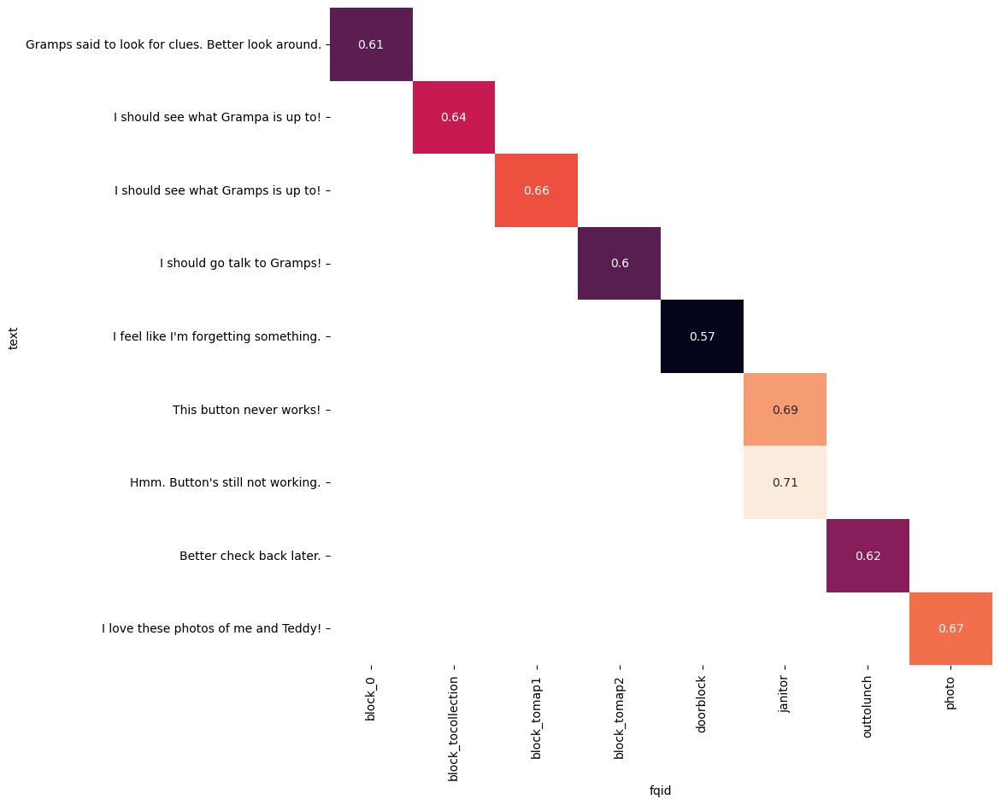

In [94]:
col_pair = ["text", "fqid"]
plot_heatmap(get_heatmap_values(df__observation_click, col_pair), figsize=(10, 10))

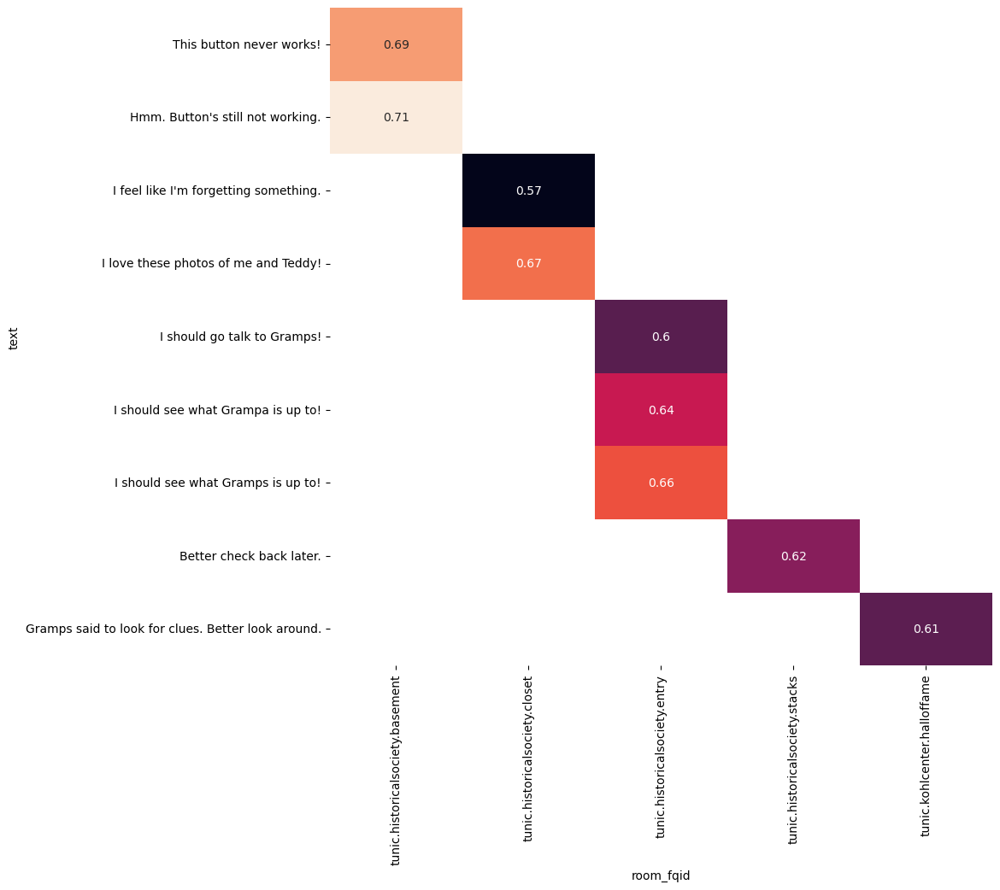

In [95]:
col_pair = ["text", "room_fqid"]
plot_heatmap(get_heatmap_values(df__observation_click, col_pair), figsize=(10, 10))

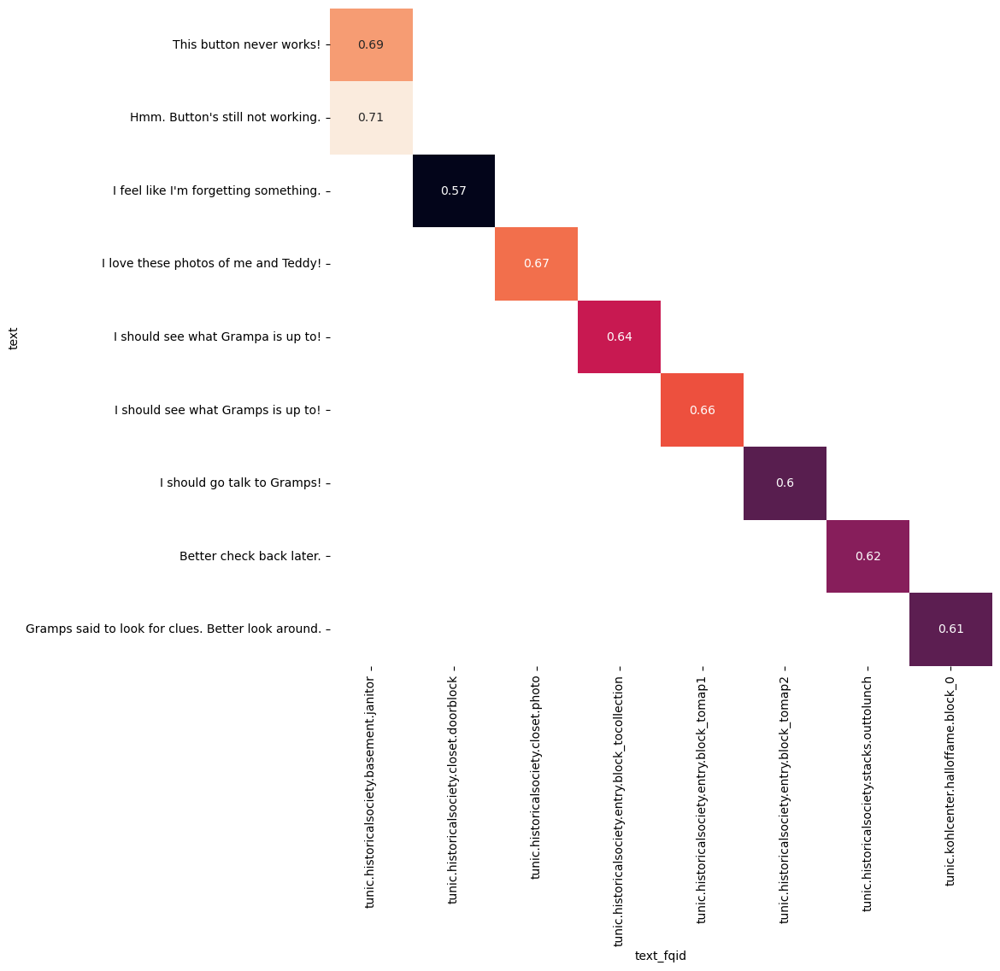

In [96]:
col_pair = ["text", "text_fqid"]
plot_heatmap(get_heatmap_values(df__observation_click, col_pair), figsize=(10, 10))

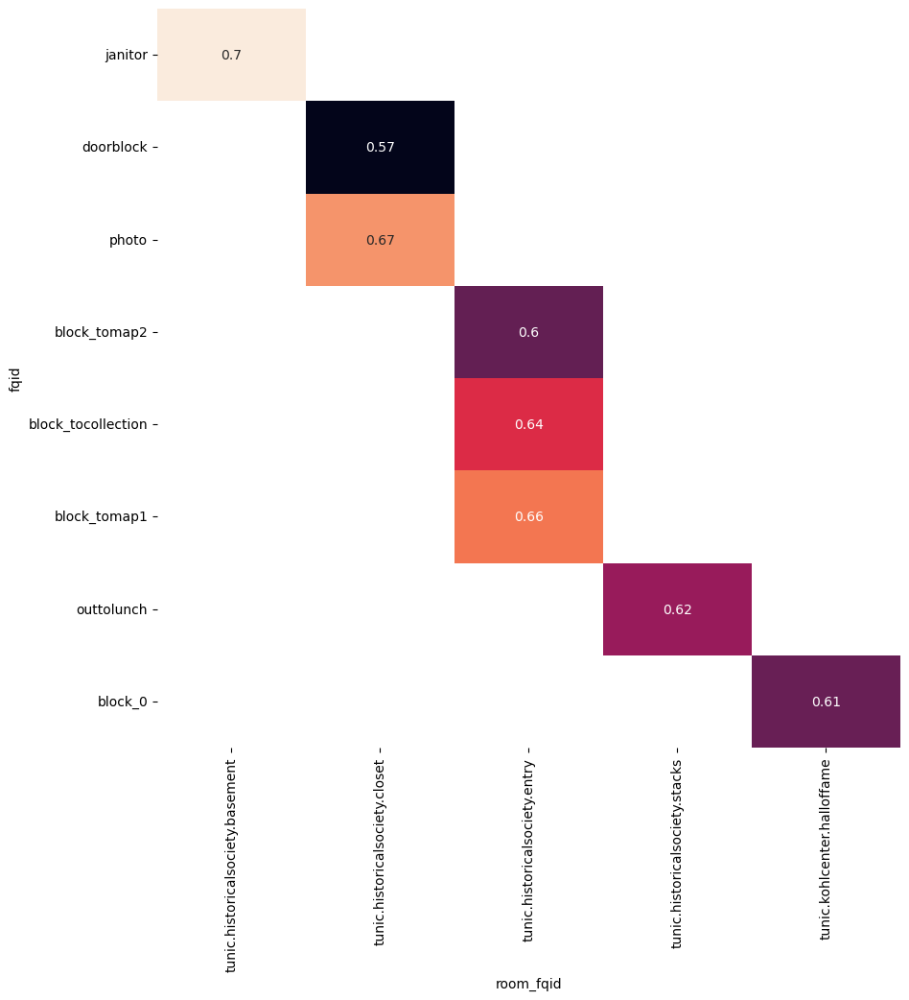

In [97]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__observation_click, col_pair), figsize=(10, 10))

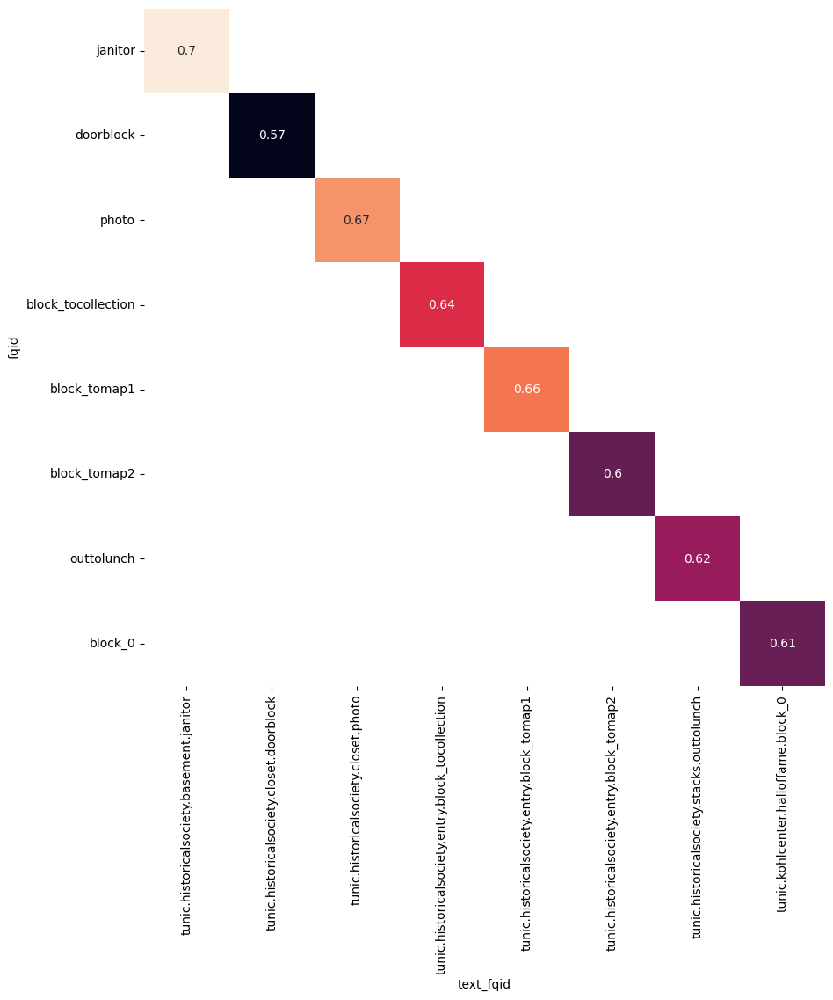

In [98]:
col_pair = ["fqid", "text_fqid"]
plot_heatmap(get_heatmap_values(df__observation_click, col_pair), figsize=(10, 10))

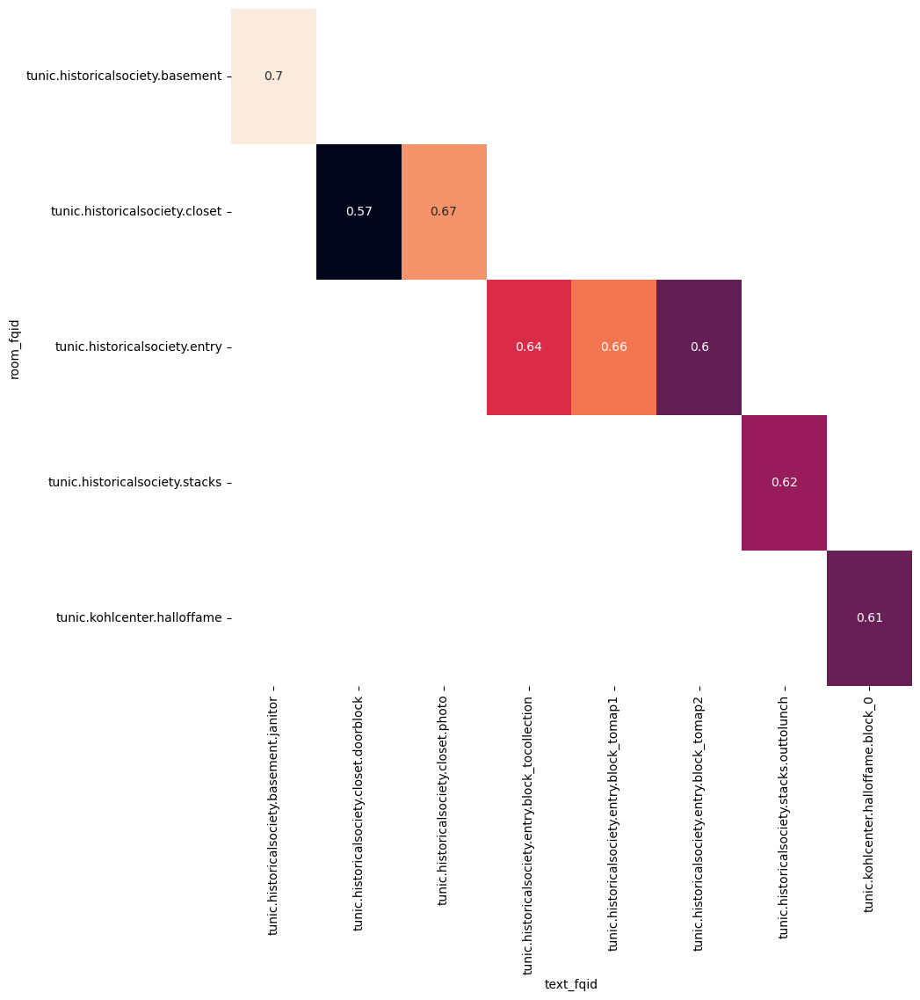

In [99]:
col_pair = ["room_fqid", "text_fqid"]
plot_heatmap(get_heatmap_values(df__observation_click, col_pair), figsize=(10, 10))

## `event_name` == `"person_click"`

In [100]:
df__person_click = df[df["event_name"] == "person_click"].reset_index(drop=True)
df__person_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,1,1323,person_click,basic,0.0,NaN,-414.0,-159.375,380.0,494.0,NaN,"Whatcha doing over there, Jo?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,1
1,20090312431273200,2,831,person_click,basic,0.0,NaN,-414.0,-159.375,380.0,494.0,NaN,Just talking to Teddy.,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,1
2,20090312431273200,3,1147,person_click,basic,0.0,NaN,-414.0,-159.375,380.0,494.0,NaN,I gotta run to my meeting!,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,1
3,20090312431273200,4,1863,person_click,basic,0.0,NaN,-413.0,-159.375,381.0,494.0,NaN,"Can I come, Gramps?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,1
4,20090312431273200,5,3423,person_click,basic,0.0,NaN,-413.0,-157.375,381.0,492.0,NaN,"Sure thing, Jo. Grab your notebook and come up...",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,1


#### Update Category Fields

In [101]:
df__person_click = recategorize_category_typed_fields(df__person_click)

In [102]:
summary = summarize_data_info(df__person_click)
summary

Data Shape: (484889, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,2423,1,2,3,0.0,5064.0
elapsed_time,int32,0.0,195832,1323,831,1147,0.0,1986867521.0
event_name,category,0.0,1,person_click,person_click,person_click,NaN,NaN
name,category,0.0,1,basic,basic,basic,NaN,NaN
level,float16,0.0,4,0.0,0.0,0.0,0.0,3.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,15315,-414.0,-414.0,-414.0,-794.0,861.5
room_coor_y,float16,0.0,13607,-159.375,-159.375,-159.375,-523.5,527.0
screen_coor_x,float16,0.0,2616,380.0,380.0,380.0,0.0,1852.0


#### Insights

- `name` field is constant (basic).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

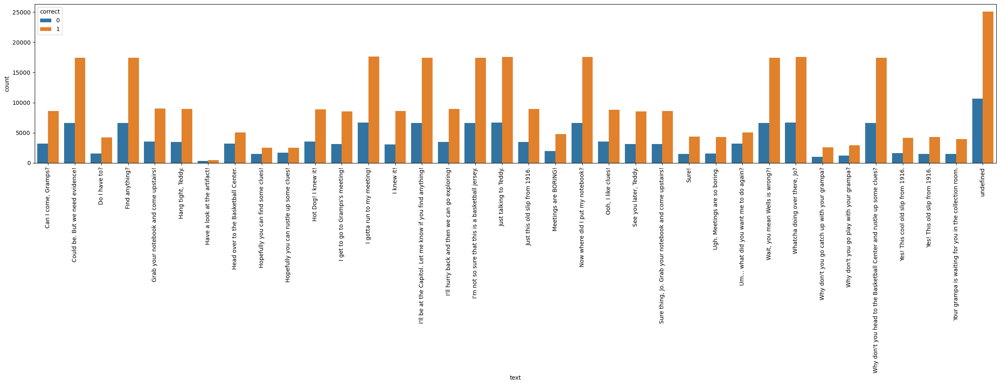

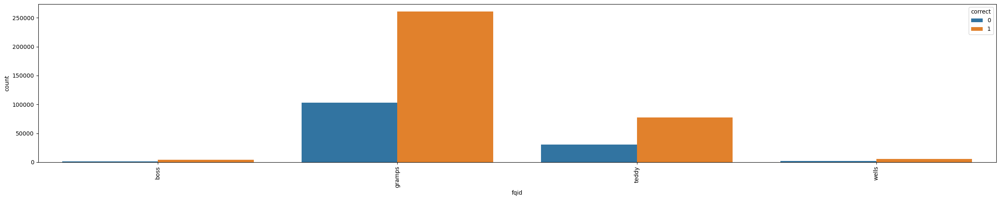

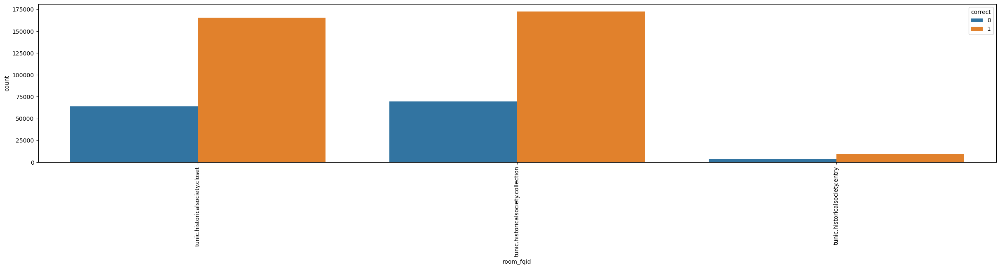

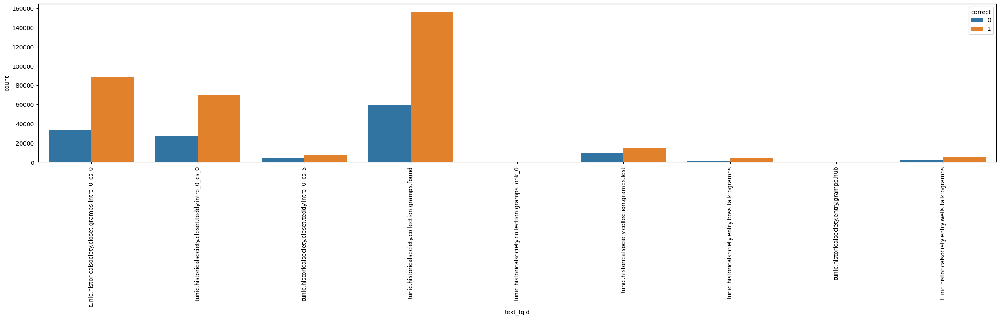

In [103]:
cat_fields_list = ["text", "fqid", "room_fqid", "text_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(30, 5))
    sns.countplot(data=df__person_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

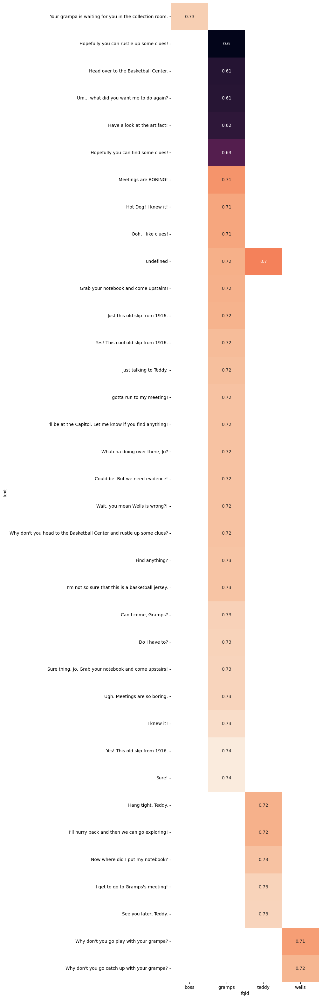

In [104]:
col_pair = ["text", "fqid"]
plot_heatmap(get_heatmap_values(df__person_click, col_pair), figsize=(6, 40))

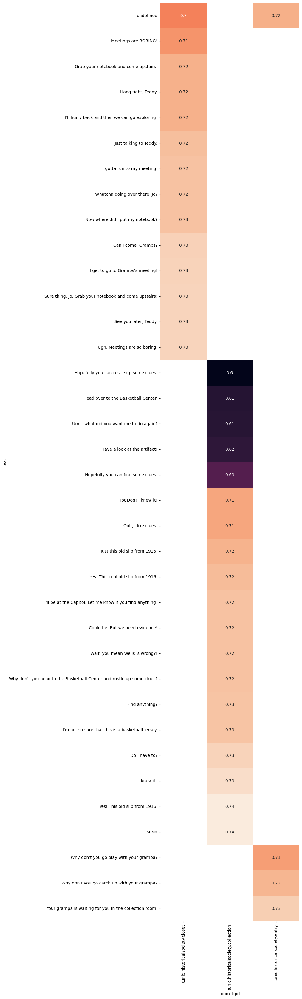

In [105]:
col_pair = ["text", "room_fqid"]
plot_heatmap(get_heatmap_values(df__person_click, col_pair), figsize=(6, 40))

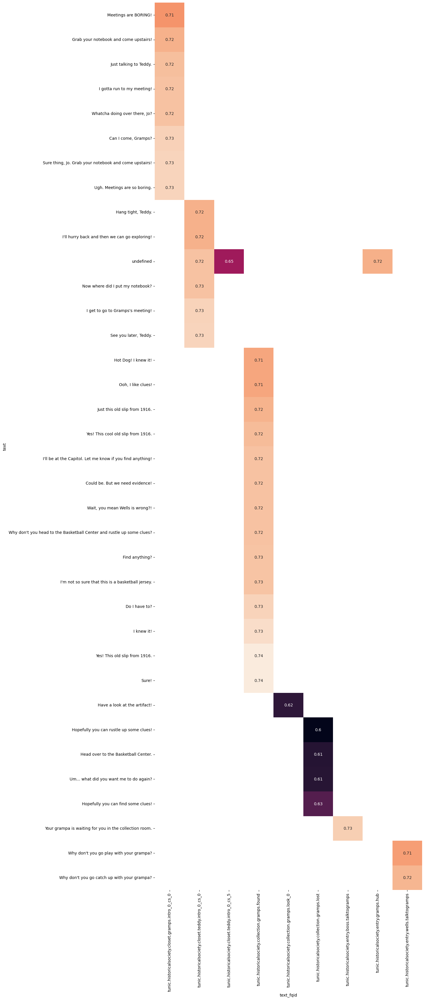

In [106]:
col_pair = ["text", "text_fqid"]
plot_heatmap(get_heatmap_values(df__person_click, col_pair), figsize=(12, 40))

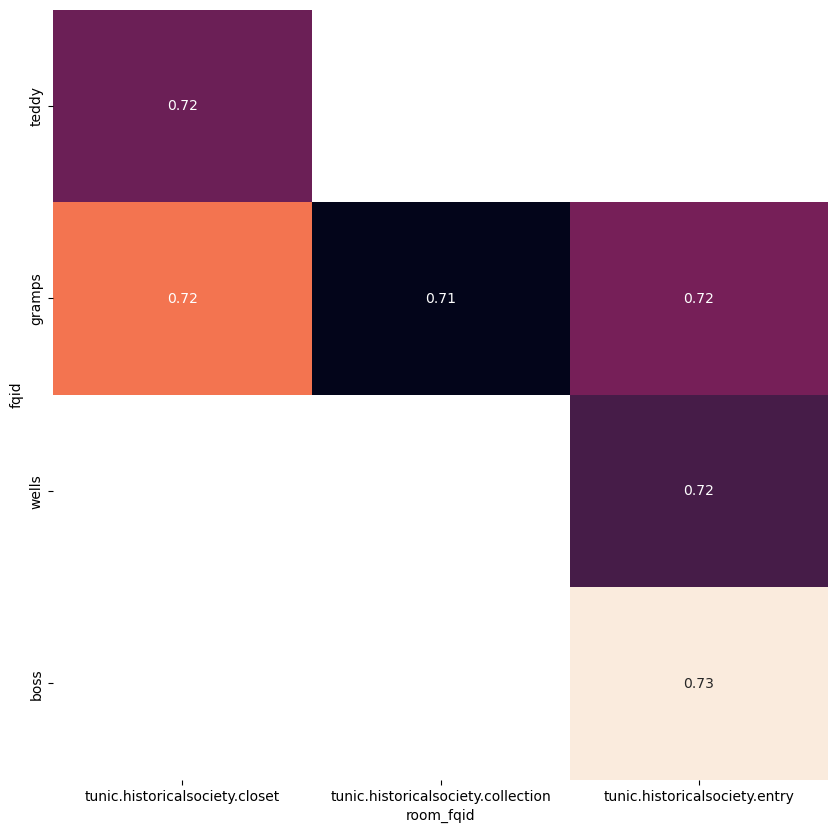

In [107]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__person_click, col_pair), figsize=(10, 10))

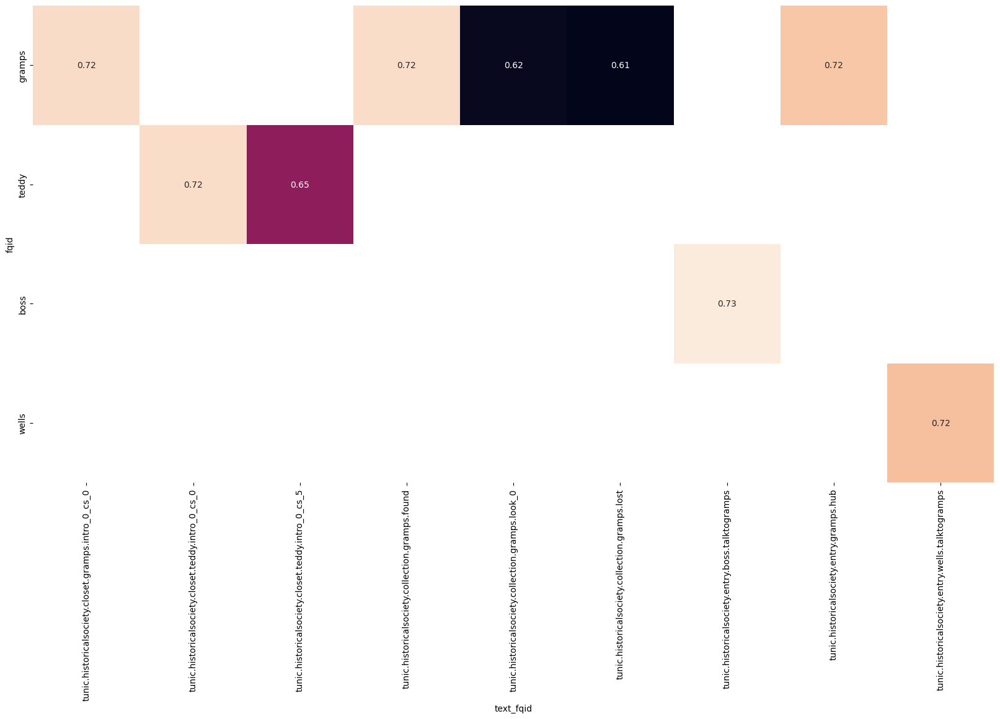

In [108]:
col_pair = ["fqid", "text_fqid"]
plot_heatmap(get_heatmap_values(df__person_click, col_pair), figsize=(20, 10))

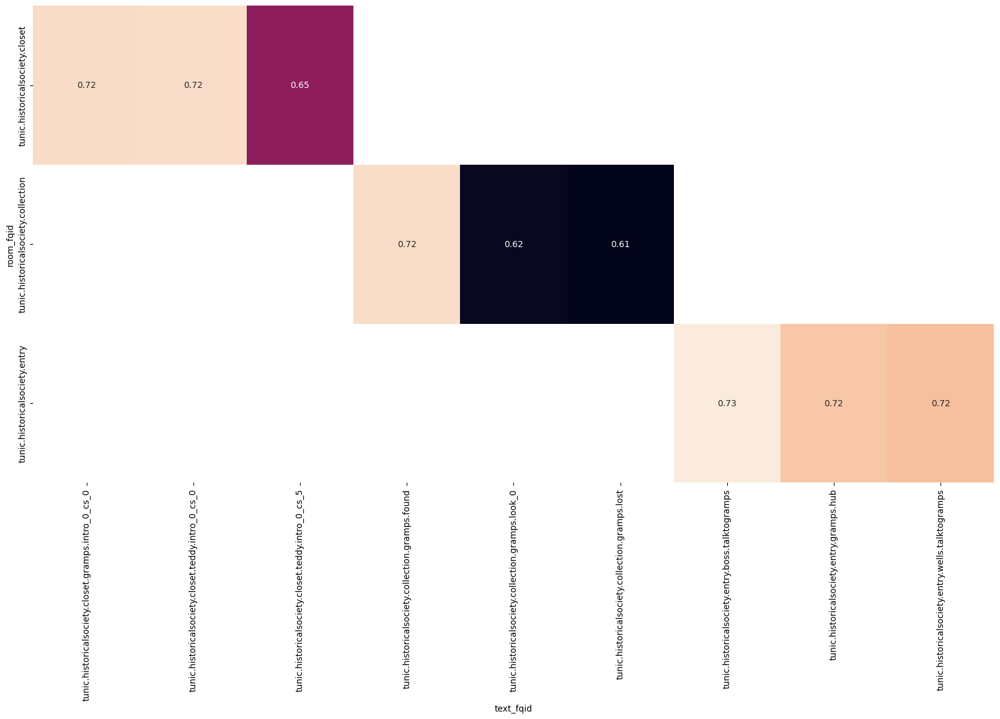

In [109]:
col_pair = ["room_fqid", "text_fqid"]
plot_heatmap(get_heatmap_values(df__person_click, col_pair), figsize=(20, 10))